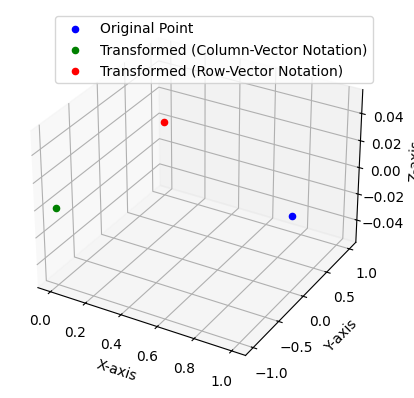

In [1]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from pytorch3d.renderer import FoVPerspectiveCameras, look_at_view_transform

# Create a simple 3D point
original_point = torch.tensor([[1.0, 0.0, 0.0]], device="cpu")  # A point on the X-axis

# Define a rotation matrix (90 degrees around the Z-axis) using column-vector convention
rotation_matrix_column = torch.tensor([
    [0, -1, 0],
    [1,  0, 0],
    [0,  0, 1]
], device="cpu")

# Convert to row-vector convention for PyTorch3D
rotation_matrix_row = rotation_matrix_column.t()

# Define the translation vector (no translation for simplicity)
translation_vector = torch.tensor([[0.0, 0.0, 0.0]], device="cpu")

# Create cameras using the row-vector and column-vector conventions
camera_column = FoVPerspectiveCameras(R=rotation_matrix_column[None, ...], T=translation_vector, fov=60, device="cpu")
camera_row = FoVPerspectiveCameras(R=rotation_matrix_row[None, ...], T=translation_vector, fov=60, device="cpu")

# Transform the original point using both cameras
transformed_point_column = camera_column.get_world_to_view_transform().transform_points(original_point)
transformed_point_row = camera_row.get_world_to_view_transform().transform_points(original_point)

# Plot the original and transformed points
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the original point
ax.scatter(original_point[0, 0].cpu().numpy(), original_point[0, 1].cpu().numpy(), original_point[0, 2].cpu().numpy(), color='blue', label='Original Point')

# Plot the point transformed by the column-vector camera
ax.scatter(transformed_point_column[0, 0].cpu().numpy(), transformed_point_column[0, 1].cpu().numpy(), transformed_point_column[0, 2].cpu().numpy(), color='green', label='Transformed (Column-Vector Notation)')

# Plot the point transformed by the row-vector camera
ax.scatter(transformed_point_row[0, 0].cpu().numpy(), transformed_point_row[0, 1].cpu().numpy(), transformed_point_row[0, 2].cpu().numpy(), color='red', label='Transformed (Row-Vector Notation)')

# Set plot labels and legend
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Z-axis")
ax.legend()
plt.show()


In [4]:
cd ..

/home/descobar/projects/xbase/src


In [196]:
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from pytorch3d.renderer import PerspectiveCameras

from pytorch3d.vis.plotly_vis import get_camera_wireframe, plot_scene

from pytorch3d.renderer import PerspectiveCameras, join_cameras_as_batch, FoVPerspectiveCameras

import os

def calculate_plot_margin(min_vals, max_vals, margin_factor=0.1):
    """
    Calculate the plot margin based on the minimum and maximum values.
    
    Args:
        min_vals: Minimum values for x, y, z axes.
        max_vals: Maximum values for x, y, z axes.
        margin_factor: Factor to determine the margin size. Default is 0.1 (10%).
        
    Returns:
        plot_margin: The calculated margin for each axis.
    """
    return margin_factor * (max_vals - min_vals)

def calculate_bounds_for_cameras(cameras_list):
    """
    Calculate the min and max bounds for all cameras in the list.

    Args:
        cameras_list: List of camera sets to plot.
    
    Returns:
        min_vals: The minimum bounds across all cameras.
        max_vals: The maximum bounds across all cameras.
        center: The center point of all cameras.
    """
    min_vals = np.array([np.inf, np.inf, np.inf])
    max_vals = np.array([-np.inf, -np.inf, -np.inf])

    for cameras in cameras_list:
        cam_wires_canonical = get_camera_wireframe().to(cameras.device)[None]
        cam_trans = cameras.get_world_to_view_transform().inverse()
        cam_wires_trans = cam_trans.transform_points(cam_wires_canonical)

        cam_min_vals = cam_wires_trans.min(dim=1).values.min(dim=0).values.cpu().numpy()
        cam_max_vals = cam_wires_trans.max(dim=1).values.max(dim=0).values.cpu().numpy()

        min_vals = np.minimum(min_vals, cam_min_vals)
        max_vals = np.maximum(max_vals, cam_max_vals)

    # Calculate the center point
    center = (min_vals + max_vals) / 2

    return min_vals, max_vals, center

def ensure_batched_cameras(cams):
    """
    Ensures that the input `cams` is a batched PerspectiveCameras object.
    """
    if isinstance(cams, list):
        return join_cameras_as_batch(cams)
    elif isinstance(cams, (PerspectiveCameras, FoVPerspectiveCameras)):
        if cams.R.ndim == 3:  # If R has three dimensions, it's already batched
            return cams
        else:
            return cams.extend(batch_size=1)
    else:
        raise ValueError("Input must be either a list of PerspectiveCameras or a single PerspectiveCameras object.")

def plot_cameras(ax, cameras, color: str = "blue", label=None, trace_path=False):
    """
    Plots a set of `cameras` objects into the matplotlib axis `ax` with
    color `color`. Optionally annotates each camera with its label.
    If trace_path is True, draws a line connecting the cameras to show the path.
    """
    # Ensure the camera wireframe is on the same device as the cameras
    device = cameras.device
    cam_wires_canonical = get_camera_wireframe().to(device)[None]
    cam_trans = cameras.get_world_to_view_transform().inverse()
    
    cam_wires_trans = cam_trans.transform_points(cam_wires_canonical)

    plot_handles = []
    trace_points = []

    for i, wire in enumerate(cam_wires_trans):
        x_, z_, y_ = wire.detach().cpu().numpy().T.astype(float)
        (h,) = ax.plot(x_, y_, z_, color=color, linewidth=1)
        plot_handles.append(h)
        if label is not None:
            ax.text(x_[0], y_[0], z_[0], f'{label[i]}', color=color)
    return plot_handles


def plot_camera_scene(cameras_list, labels=None, colors=None, annotate=False,title="Camera Visualization",trace_path = True, save_path=None):
    """
    Plots multiple sets of cameras in the same plot.

    Args:
        cameras_list: List of camera sets to plot.
        labels: List of labels corresponding to each camera set. Defaults to "Camera 1", "Camera 2", etc.
        colors: List of colors corresponding to each camera set. If None, applies a gradient from blue to red.
        annotate: If True, annotates each camera with its index.
    """
    if labels is None:
        labels = [f"{i}" for i in range(len(cameras_list))]

    if colors is None:
        # Apply gradient colors from blue to red
        colors = cm.coolwarm(np.linspace(0, 1, len(cameras_list)))

    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection="3d")
    ax.clear()
    ax.set_title(title)

    plot_handles = []
    all_trace_points = []

    for i, (cameras, color) in enumerate(zip(cameras_list, colors)):
        cameras = ensure_batched_cameras(cameras)
        handle = plot_cameras(ax, cameras, color=color, label=[labels[i]] if annotate else None, trace_path=trace_path)
        plot_handles.append((handle[0], labels[i]))

        # Collect trace points for all cameras if trace_path is enabled
        if trace_path:
            cam_trans = cameras.get_world_to_view_transform().inverse()
            for i in range(cameras.R.shape[0]):
                cam_position = cam_trans.get_matrix()[i, :3, 3].detach().cpu().numpy()
                print(cam_trans.get_matrix())
                all_trace_points.append(cam_position)

    # Draw a single line connecting all cameras across different sets
    if trace_path and len(all_trace_points) > 1:
        all_trace_points = np.array(all_trace_points)
        ax.plot(all_trace_points[:, 0], all_trace_points[:, 2], all_trace_points[:, 1], color="black", linestyle="--", linewidth=1)
    
    # Calculate the min and max bounds for all cameras
    min_vals, max_vals, center = calculate_bounds_for_cameras(cameras_list)

    # Calculate the maximum range from the center to the bounds
    max_range = np.max(max_vals - min_vals) / 2.0

    # Apply a scaling factor to make the plot slightly larger
    scale_factor = 1.1
    plot_margin = max_range * scale_factor

    # Set plot limits centered around the center point
    ax.set_xlim3d([center[0] - plot_margin, center[0] + plot_margin])
    ax.set_ylim3d([center[1] - plot_margin, center[1] + plot_margin])
    ax.set_zlim3d([center[2] - plot_margin, center[2] + plot_margin])
    """
    # Set plot limits with a fixed aspect ratio
    max_range = np.max(max_vals - min_vals + 2 * plot_margin)
    ax.set_xlim3d([min_vals[0] - plot_margin[0], min_vals[0] - plot_margin[0] + max_range])
    ax.set_ylim3d([min_vals[1] - plot_margin[1], min_vals[1] - plot_margin[1] + max_range])
    ax.set_zlim3d([min_vals[2] - plot_margin[2], min_vals[2] - plot_margin[2] + max_range])
    
    # Set plot limits slightly larger than the bounds
    ax.set_xlim3d([min_vals[0] - plot_margin[0], max_vals[0] + plot_margin[0]])
    ax.set_ylim3d([min_vals[1] - plot_margin[1], max_vals[1] + plot_margin[1]])
    ax.set_zlim3d([min_vals[2] - plot_margin[2], max_vals[2] + plot_margin[2]])
    
    plot_radius = 3
    ax.set_xlim3d([-plot_radius, plot_radius])
    ax.set_ylim3d([3 - plot_radius, 3 + plot_radius])
    ax.set_zlim3d([-plot_radius, plot_radius])
    """
    ax.set_xlabel("x")
    ax.set_ylabel("z")
    ax.set_zlabel("y")

    #ax.legend([h for h, _ in plot_handles], [l for _, l in plot_handles], loc="upper center", bbox_to_anchor=(0.5, 0))
    # Save the plot if a save path is provided
    if save_path is not None:
        plt.savefig(save_path)
        print(f"Plot saved to {save_path}")

    plt.show()


In [45]:
ls

__init__.py  config/  main.py  models/  notebooks/  utils/


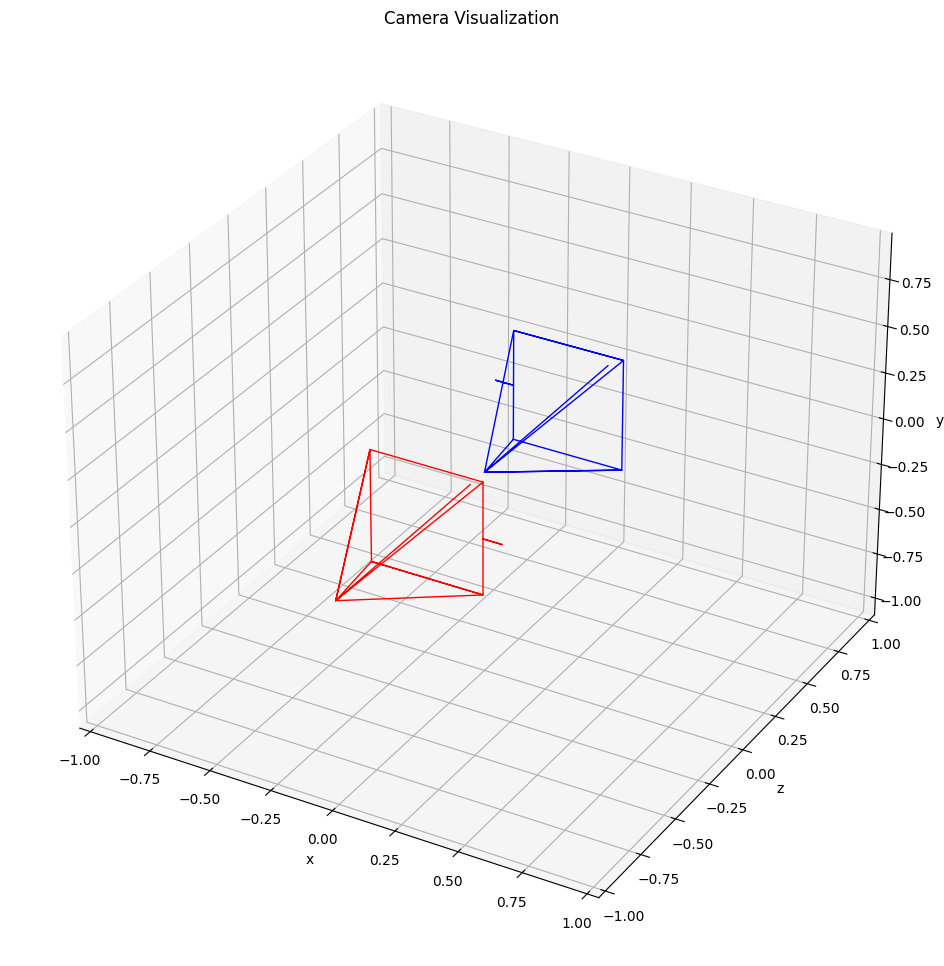

In [187]:
import torch
import matplotlib.pyplot as plt
from pytorch3d.renderer import FoVPerspectiveCameras
from pytorch3d.vis.plotly_vis import get_camera_wireframe
#from utils.vis.cameraplots import plot_multiple_camera_scenes

# Define rotation matrix using column-vector convention (90 degrees around the Z-axis)
rotation_matrix_column = torch.tensor([
    [0, -1, 0],
    [1,  0, 0],
    [0,  0, 1]
], dtype=torch.float32)

# Convert to row-vector convention for PyTorch3D
rotation_matrix_row = rotation_matrix_column.t()

# Define the translation vector
translation_vector_row = torch.tensor([0.0, 0.0, 1.0], dtype=torch.float32)
# Define the translation vector
translation_vector_col = torch.tensor([0.0, 0.0, 0.0], dtype=torch.float32)

# Define field of view
fov_degrees = 55.0

# Create cameras using the row-vector and column-vector conventions
camera_column = FoVPerspectiveCameras(R=rotation_matrix_column[None, ...], T=translation_vector_col[None, ...], fov=fov_degrees, device="cpu")
camera_row = FoVPerspectiveCameras(R=rotation_matrix_row[None, ...], T=translation_vector_row[None, ...], fov=fov_degrees, device="cpu")

# Plot both cameras in the same plot
plot_camera_scene(
    cameras_list=[camera_column, camera_row],
    labels=["Column-Vector Convention", "Row-Vector Convention"],
    colors=["blue", "red"]
)



In [176]:
device ='cuda'
from PIL import Image
from pytorch3d.utils import opencv_from_cameras_projection
from pytorch3d.structures import Pointclouds
from pytorch3d.renderer import (
    look_at_view_transform,
    PerspectiveCameras,
    FoVPerspectiveCameras
)
import numpy as np
import torch

image = "/home/descobar/projects/xfigura/xfiguraModels/output/outputFlux/2024-08-04/An_opulent_interior_pool_space_graced_by_a_towering_mural,_a_0066.png"
img = Image.open(image).convert("RGB")
img = img.crop((0, 0, img.width - img.width % 8, img.height - img.height % 8))
    
image_size = img.size  
w, h = image_size

#camera settings
mode = "360"
step_size = 25

if mode == "single":
    azim_steps = [0]
elif mode == "stage":
    azim_steps = [0, step_size, -step_size]
elif mode == "360":
    azim_steps = [x for x in range(0, 360, step_size) if x < 272.5] + [272.5, 316.25]

look_at_params = [(azim, 0, 0.01, torch.zeros((1, 3))) for azim in azim_steps]

cams = []
camera_positions = []
camera_intrinsics = []
camera_extrinsics = []


for azim, elev, dist, at in look_at_params:
    
    R, T = look_at_view_transform(azim=azim, elev=elev, dist=dist, at=at, device=device)
    print(R)
    cameras = PerspectiveCameras(R=R, T=T, focal_length=torch.tensor([w], dtype=torch.float32), 
                                 principal_point=(((h-1)/2, (w-1)/2),), image_size=(w, h), device=device, in_ndc=False)
    cams.append(cameras)
    
    # Extracting focal lengths (fx, fy) and principal points (cx, cy)
    fx, fy = cameras.focal_length.squeeze().cpu().numpy()
    cx, cy = cameras.principal_point.squeeze().cpu().numpy()
    print(fx, fy)
    

tensor([[[-1.,  0.,  0.],
         [ 0.,  1.,  0.],
         [ 0.,  0., -1.]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[-0.9063,  0.0000, -0.4226],
         [ 0.0000,  1.0000,  0.0000],
         [ 0.4226,  0.0000, -0.9063]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[-0.6428,  0.0000, -0.7660],
         [ 0.0000,  1.0000,  0.0000],
         [ 0.7660,  0.0000, -0.6428]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[-0.2588,  0.0000, -0.9659],
         [ 0.0000,  1.0000,  0.0000],
         [ 0.9659,  0.0000, -0.2588]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[ 0.1736,  0.0000, -0.9848],
         [-0.0000,  1.0000,  0.0000],
         [ 0.9848,  0.0000,  0.1736]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[ 0.5736,  0.0000, -0.8192],
         [-0.0000,  1.0000,  0.0000],
         [ 0.8192,  0.0000,  0.5736]]], device='cuda:0')
[1024. 1024.] [1024. 1024.]
tensor([[[ 0.8660,  0.0000, -0.5000],
         [-0.0000,  1.0000,  0.0

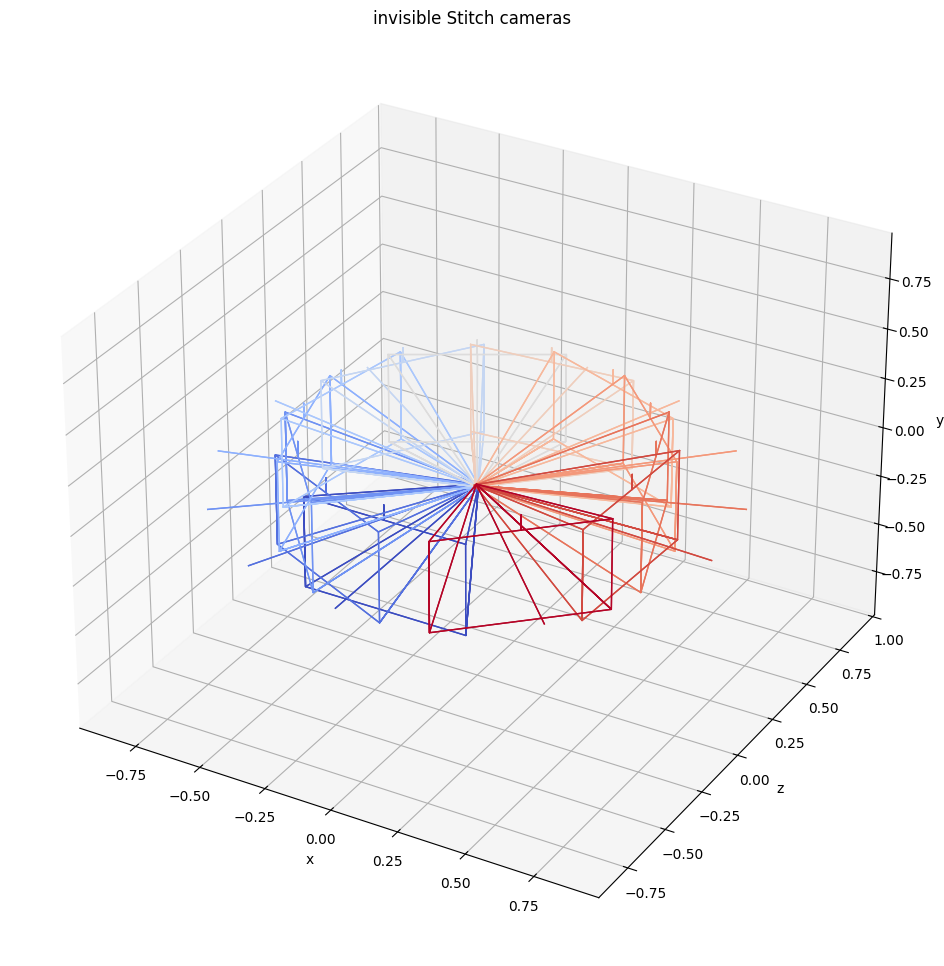

In [170]:
# Plot both cameras in the same plot
plot_camera_scene(
    cameras_list=cams,
    title="invisible Stitch cameras",
    trace_path=True
)

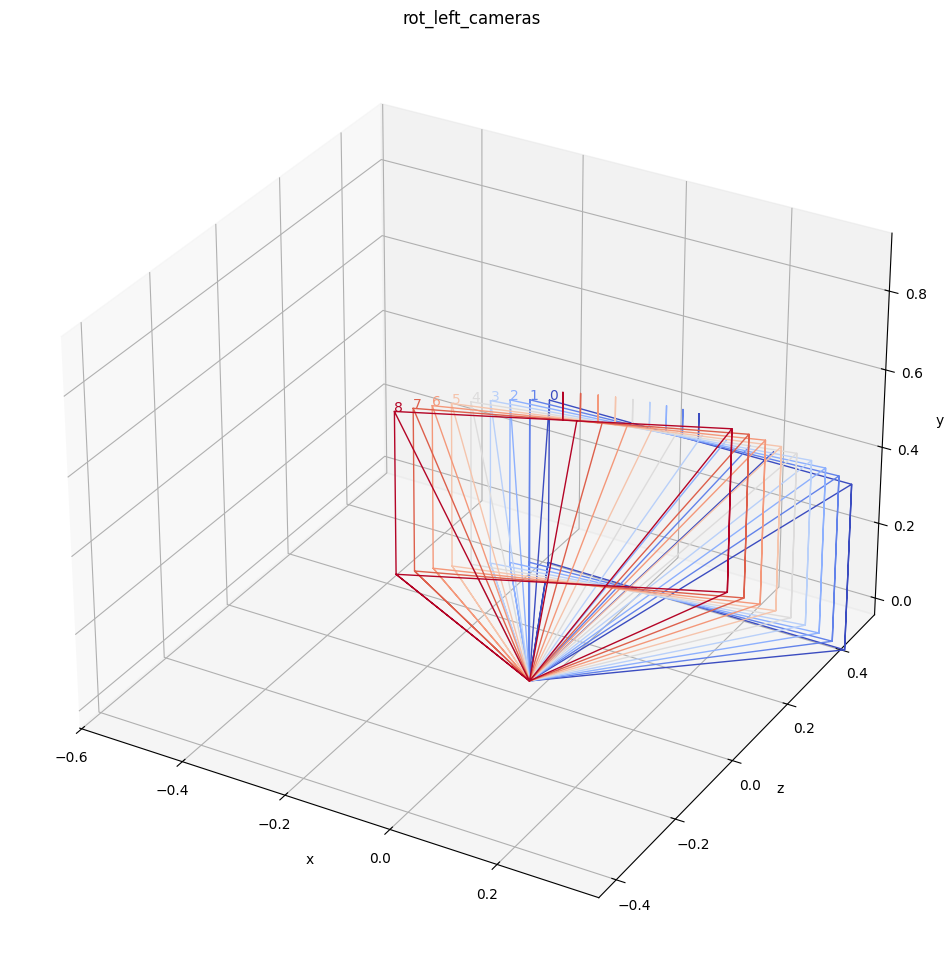

In [177]:
import numpy as np
import torch
from pytorch3d.transforms import euler_angles_to_matrix
from pytorch3d.renderer import PerspectiveCameras, FoVPerspectiveCameras
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

# Updated get_extrinsics function
def get_extrinsics(rot_xyz, trans_xyz, device="cpu"):
    T = torch.tensor(trans_xyz, dtype=torch.float32)
    R = euler_angles_to_matrix(torch.tensor(rot_xyz, dtype=torch.float32), "XYZ")

    RT = torch.cat([R, T[:, None]], dim=-1).to(device)  # RT is [4,4]
    RT = torch.cat([RT, torch.tensor([[0, 0, 0, 1]], dtype=torch.float32).to(RT.device)], dim=0)

    return RT

def _rot_x(x):
    '''
    positive: look up, negative: look down

    :param x: rotation in degrees
    '''
    return np.array([x * np.pi / 180, 0, 0], dtype=np.float32)


def _rot_y(x):
    '''
    positive: look right, negative: look left

    :param x: rotation in degrees
    '''
    return np.array([0, x * np.pi / 180, 0], dtype=np.float32)


def _rot_z(x):
    '''
    positive: tilt left, negative: tilt right

    :param x: rotation in degrees
    '''
    return np.array([0, 0, x * np.pi / 180], dtype=np.float32)


def _trans_x(x):
    '''
    positive: right, negative: left

    :param x: translation amount
    '''
    return np.array([x, 0, 0], dtype=np.float32)


def _trans_y(x):
    '''
    positive: down, negative: up

    :param x: translation amount
    '''
    return np.array([0, x, 0], dtype=np.float32)


def _trans_z(x):
    '''
    positive: back, negative: front

    :param x: translation amount
    '''
    return np.array([0, 0, x], dtype=np.float32)


def _config_fn(fn, **kwargs):
    return lambda i, steps: fn(i, steps, **kwargs)

#default is 60 steps
def _circle(i, steps=60, txmax=0, txmin=0, tymax=0, tymin=0, tzmax=0, tzmin=0, rxmax=0, rxmin=0, rymax=0, rymin=0, rzmax=0, rzmin=0):
    tx_delta = (txmax - txmin) / (steps // 2)
    ty_delta = (tymax - tymin) / (steps // 2)
    tz_delta = (tzmax - tzmin) / (steps // 2)

    rx_delta = (rxmax - rxmin) / (steps // 2)
    ry_delta = (rymax - rymin) / (steps // 2)
    rz_delta = (rzmax - rzmin) / (steps // 2)

    f = i % (steps // 2)

    tx = txmin + f * tx_delta
    ty = tymin + f * ty_delta
    tz = tzmin + f * tz_delta

    rx = rxmin + f * rx_delta
    ry = rymin + f * ry_delta
    rz = rzmin + f * rz_delta

    if i < steps // 2:
        T = _trans_x(-tx)
        T += _trans_z(tz)
        T += _trans_y(ty)
        R = _rot_y(ry)
        R += _rot_x(rx)
        R += _rot_z(rz)
    else:
        T = _trans_x(tx)
        T += _trans_z(tz)
        T += _trans_y(-ty)
        R = _rot_y(-ry)
        R += _rot_x(-rx)
        R += _rot_z(-rz)

    return get_extrinsics(R, T)

#change rotation angle
def _rot_left(i, steps=120, ty=0, rx=0):
    angle = i * 360 // steps

    T = _trans_x(0)
    T += _trans_y(ty)
    R = _rot_y(-angle)
    R += _rot_x(rx)

    return get_extrinsics(R, T)

def _back_and_forth(i, steps=20, txmax=0, txmin=0, tymax=0, tymin=0, tzmax=0, tzmin=0, rxmax=0, rxmin=0, rymax=0, rymin=0, rzmax=0, rzmin=0):
    tx_delta = (txmax - txmin) / (steps // 2)
    ty_delta = (tymax - tymin) / (steps // 2)
    tz_delta = (tzmax - tzmin) / (steps // 2)

    rx_delta = (rxmax - rxmin) / (steps // 2)
    ry_delta = (rymax - rymin) / (steps // 2)
    rz_delta = (rzmax - rzmin) / (steps // 2)

    f = i % (steps // 2)

    tx = txmin + f * tx_delta
    ty = tymin + f * ty_delta
    tz = tzmin + f * tz_delta

    rx = rxmin + f * rx_delta
    ry = rymin + f * ry_delta
    rz = rzmin + f * rz_delta

    if i < steps // 2:
        T = _trans_x(-tx)
        T += _trans_z(tz)
        T += _trans_y(ty)
        R = _rot_y(-ry)
        R += _rot_x(rx)
        R += _rot_z(rz)
    else:
        T = _trans_x(tx)
        T += _trans_z(tz)
        T += _trans_y(-ty)
        R = _rot_y(ry)
        R += _rot_x(-rx)
        R += _rot_z(-rz)

    return get_extrinsics(R, T)


trans_t = lambda t: torch.Tensor([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, t],
    [0, 0, 0, 1]]).float()

rot_phi = lambda phi: torch.Tensor([
    [1, 0, 0, 0],
    [0, np.cos(phi), -np.sin(phi), 0],
    [0, np.sin(phi), np.cos(phi), 0],
    [0, 0, 0, 1]]).float()

rot_theta = lambda th: torch.Tensor([
    [np.cos(th), 0, -np.sin(th), 0],
    [0, 1, 0, 0],
    [np.sin(th), 0, np.cos(th), 0],
    [0, 0, 0, 1]]).float()


def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi / 180. * np.pi) @ c2w
    c2w = rot_theta(theta / 180. * np.pi) @ c2w
    # c2w = torch.Tensor(np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]])) @ c2w
    c2w[0:3, 3] = -1 * c2w[0:3, 3]
    return c2w


def sample_points_on_unit_sphere(n_sample=9, radius=4.0, height=0.0):
    c2w = torch.stack([pose_spherical(angle, 0, radius) for angle in np.linspace(-180,180,n_sample)], dim=0)
    c2w[:, 1, 3] = height
    return c2w

def spherical_trajectory(steps, radius, height):
    c2w = sample_points_on_unit_sphere(steps, radius, height)
    return torch.inverse(c2w)


def _sphere_rot_xz(i, steps, radius=4.0, height=0.0, phi=20.0):
    rot_angle = i * 360 / steps
    rot_angle = rot_angle
    phi = phi if height > 0 else -phi if height < 0 else 0
    c2w = pose_spherical(rot_angle, phi, radius)
    c2w[1, 3] = height
    return torch.inverse(c2w)

def _double_sphere_rot_xz(i, steps, radius=4.0, height=0.0, phi=20.0):
    rot_angle = i * 360 / steps
    rot_angle = rot_angle
    phi = phi if height > 0 else -phi if height < 0 else 0
    c2w = pose_spherical(rot_angle, phi, radius)
    if i % 2 == 0:
        c2w[0:3, 3] = 0
    else:
        c2w[1, 3] = height
    return torch.inverse(c2w)

# Create camera sets using _circle and _rot_left
circle_cameras = []
rot_left_cameras = []

for i in range(9):
    rot_left_extrinsics = _rot_left(i)
    R_rot_left = rot_left_extrinsics[:3, :3].unsqueeze(0)
    T_rot_left = rot_left_extrinsics[:3, 3].unsqueeze(0)
    rot_left_cameras.append(FoVPerspectiveCameras(R=R_rot_left, T=T_rot_left))


# Plot the cameras
plot_camera_scene(
    cameras_list=rot_left_cameras,
    colors=None,
    annotate=True,
    title = "rot_left_cameras",
)

[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]


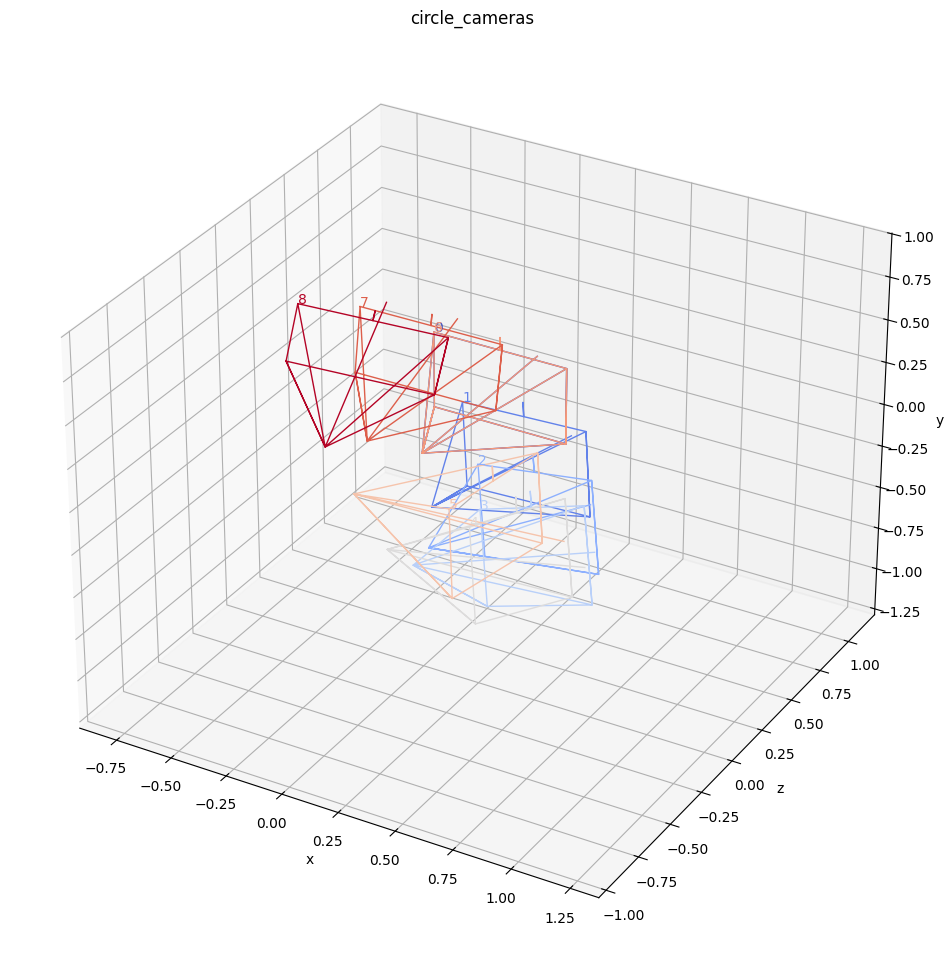

In [191]:
# Generate cameras using the circle function
circle_cameras = []
for i in range(9):
    extrinsics = _circle(i, steps=12, txmax=1, tymax=1, tzmax=1, rxmax=45, rymax=45, rzmax=45)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    circle_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Plot the cameras
plot_camera_scene(
    cameras_list=circle_cameras,
    colors=None,
    annotate=True,
    title = "circle_cameras",
    trace_path=True
)

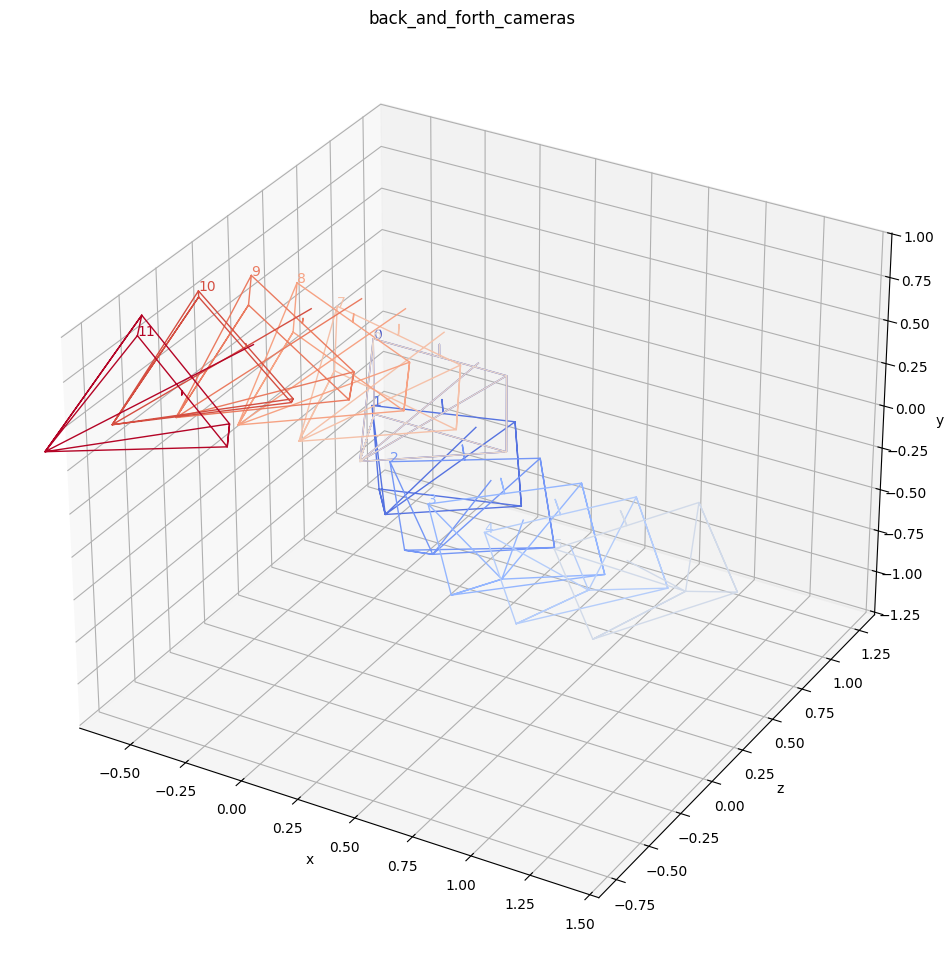

In [179]:
# Generate cameras using the _back_and_forth function
back_and_forth_cameras = []
for i in range(12):
    extrinsics = _back_and_forth(i, steps=12, txmax=1, tymax=1, tzmax=1, rxmax=45, rymax=45, rzmax=45)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    back_and_forth_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Plot the cameras
plot_camera_scene(
    cameras_list=back_and_forth_cameras,
    annotate=True,
    title = "back_and_forth_cameras"
)

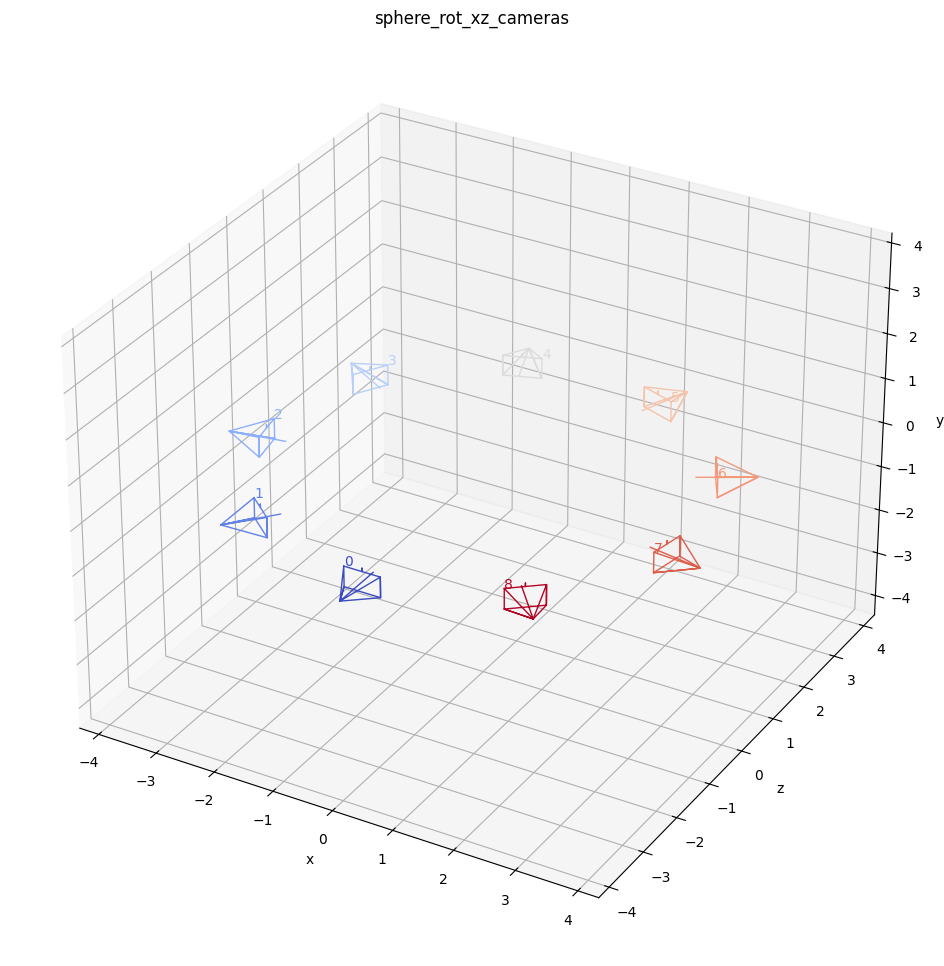

In [126]:
# Generate cameras using the _sphere_rot_xz function
sphere_rot_xz_cameras = []
for i in range(9):
    extrinsics = _sphere_rot_xz(i, steps=9, radius=4.0, height=0.0, phi=20.0)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    sphere_rot_xz_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Plot the cameras
plot_camera_scene(
    cameras_list=sphere_rot_xz_cameras,
    annotate=True,
    title = "sphere_rot_xz_cameras"
)

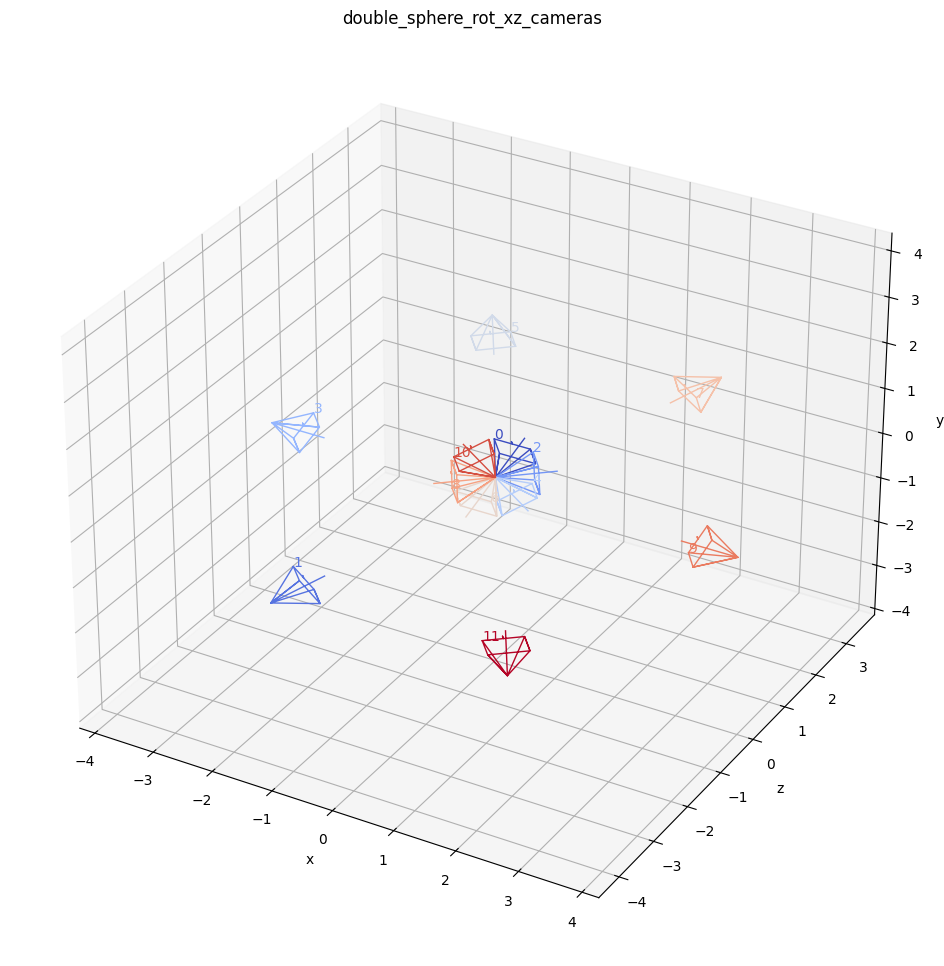

In [127]:
# Generate cameras using the _double_sphere_rot_xz function
double_sphere_rot_xz_cameras = []
for i in range(12):
    extrinsics = _double_sphere_rot_xz(i, steps=12, radius=4.0, height=1.0, phi=20.0)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    double_sphere_rot_xz_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))
    
# Plot the cameras
plot_camera_scene(
    cameras_list=double_sphere_rot_xz_cameras,
    annotate=True,
    title = "double_sphere_rot_xz_cameras"
)

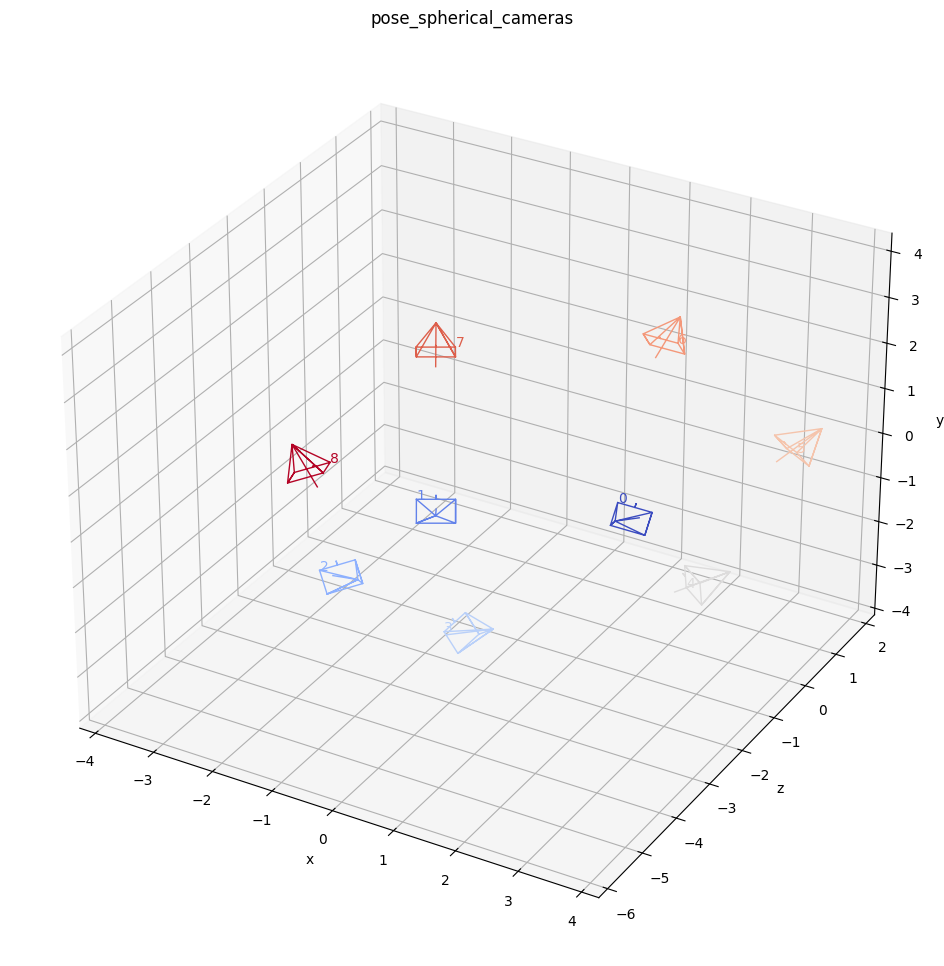

In [128]:
# Generate cameras using the pose_spherical function
pose_spherical_cameras = []
for i in range(9):
    extrinsics = pose_spherical(i * 30, 30, radius=4.0)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    pose_spherical_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Plot the cameras
plot_camera_scene(
    cameras_list=pose_spherical_cameras,
    annotate=True,
    title="pose_spherical_cameras"
)

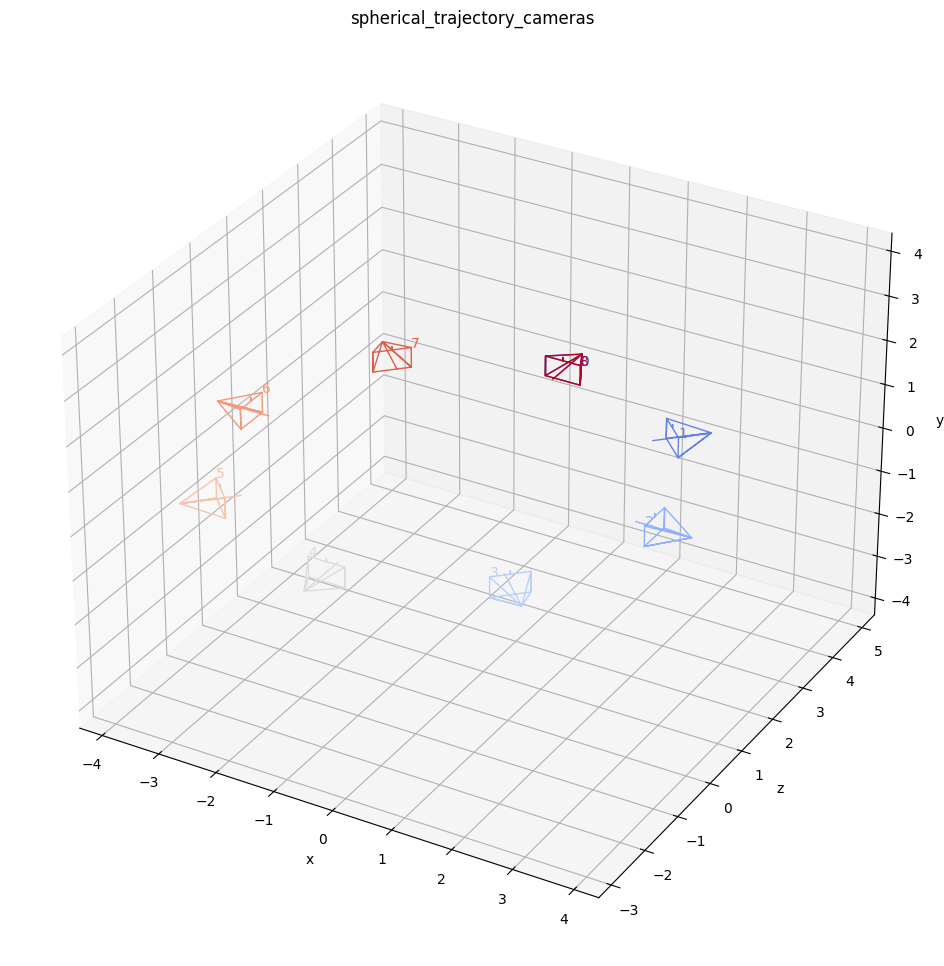

In [164]:
# Generate cameras using the spherical_trajectory function
spherical_trajectory_cameras = []
c2w_matrices = spherical_trajectory(steps=9, radius=4.0, height=1.0)
for i in range(c2w_matrices.shape[0]):
    R = c2w_matrices[i][:3, :3]
    T = c2w_matrices[i][:3, 3]
    spherical_trajectory_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Plot the cameras
plot_camera_scene(
    cameras_list=spherical_trajectory_cameras,
    annotate=True,
    title="spherical_trajectory_cameras"
)

In [133]:
def forward(height=0, rot=0, txmax=2):
    return _config_fn(_circle, txmax=txmax, rymax=90, rymin=45, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def forward_small(height=0, rot=0):
    return _config_fn(_circle, txmax=0.5, rymax=90, rymin=45, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def left_right(height=0, rot=0):
    return _config_fn(_circle, tzmax=2, rymax=90, rymin=45, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def backward(height=0, rot=0):
    return _config_fn(_circle, txmax=-2, rymax=90, rymin=45, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def backward2(height=0, rot=0, txmax=1):
    return _config_fn(_circle, txmax=txmax, rymax=225, rymin=180, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def backward2_small(height=0, rot=0):
    return _config_fn(_circle, txmax=0.5, rymax=225, rymin=180, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def backward3(height=0, rot=0, txmax=1):
    return _config_fn(_circle, txmax=txmax, rymax=270, rymin=225, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def backward3_small(height=0, rot=0):
    return _config_fn(_circle, txmax=0.5, rymax=270, rymin=225, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def rot_left_up_down(height=0, rot=0):
    return _config_fn(_rot_left, ty=height, rx=rot)


def back_and_forth_forward(height=0, rot=0):
    return _config_fn(_back_and_forth, txmax=0, tzmax=-2, rymax=60, rymin=15, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_backward(height=0, rot=0):
    return _config_fn(_back_and_forth, txmax=0, tzmax=-2, rymax=-120, rymin=-165, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_forward_reverse(height=0, rot=0, tzmax=2):
    return _config_fn(_back_and_forth, txmax=0, tzmax=tzmax, rymax=-15, rymin=-60, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_forward_reverse_small(height=0, rot=0):
    return _config_fn(_back_and_forth, txmax=0, tzmax=0.5, rymax=-15, rymin=-60, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_backward_reverse(height=0, rot=0, tzmax=2):
    return _config_fn(_back_and_forth, txmax=0, tzmax=tzmax, rymax=165, rymin=120, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_backward_reverse_small(height=0, rot=0):
    return _config_fn(_back_and_forth, txmax=0, tzmax=0.5, rymax=165, rymin=120, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def back_and_forth_backward_reverse2(height=0, rot=0):
    return _config_fn(_back_and_forth, txmax=0, tzmax=3, rymax=165, rymin=60, tymin=height, tymax=height, rxmin=rot, rxmax=rot)


def sphere_rot(radius=4.0, height=0.0, phi=20.0):
    return _config_fn(_sphere_rot_xz, radius=radius, height=height, phi=phi)


def double_rot(radius=4.0, height=0.0, phi=2.0):
    return _config_fn(_double_sphere_rot_xz, radius=radius, height=height, phi=phi)

In [135]:
# Generate cameras using the forward function
steps = 12
forward_fn = forward(height=1.0, rot=10)
forward_cameras = []
for i in range(steps):
    extrinsics = forward_fn(i, steps)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    forward_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Generate cameras using the backward function
backward_fn = backward(height=1.0, rot=10)
backward_cameras = []
for i in range(steps):
    extrinsics = backward_fn(i, steps)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    backward_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

# Generate cameras using the sphere_rot function
sphere_rot_fn = sphere_rot(radius=4.0, height=1.0, phi=20.0)
sphere_rot_cameras = []
for i in range(steps):
    extrinsics = sphere_rot_fn(i, steps)
    R = extrinsics[:3, :3]
    T = extrinsics[:3, 3]
    sphere_rot_cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

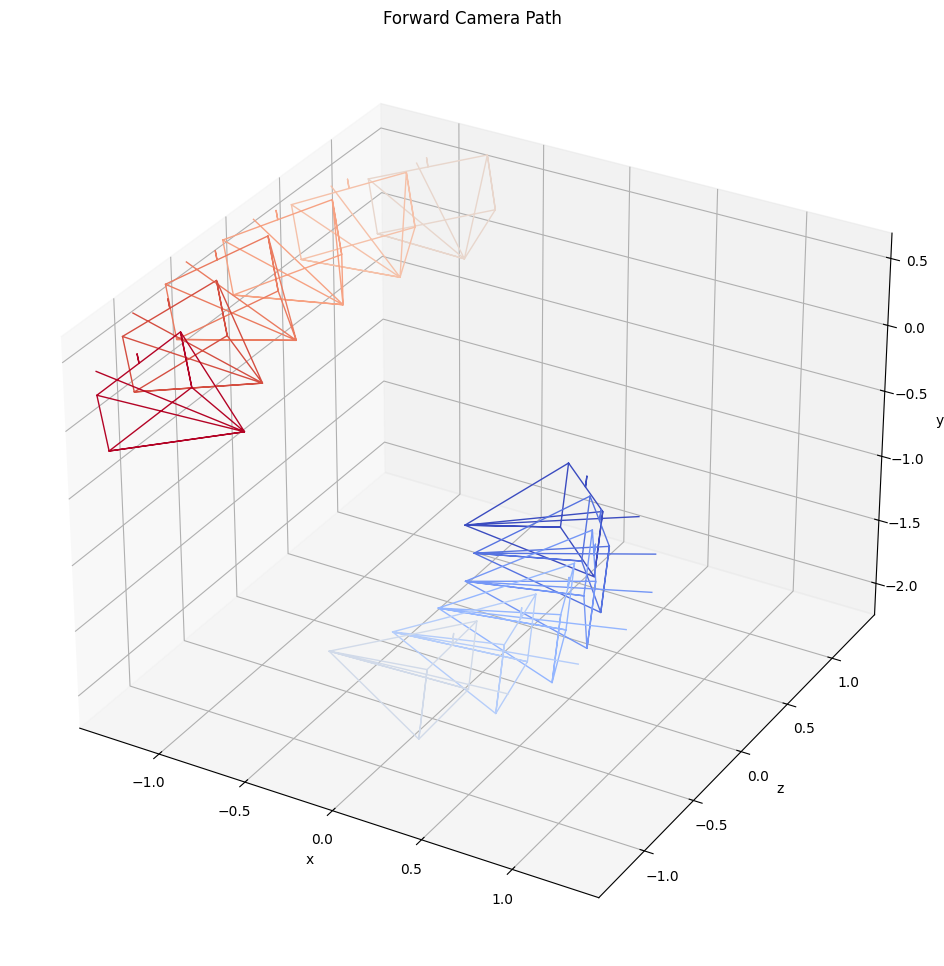

In [136]:
# Plot the camera positions
plot_camera_scene(forward_cameras, title="Forward Camera Path")

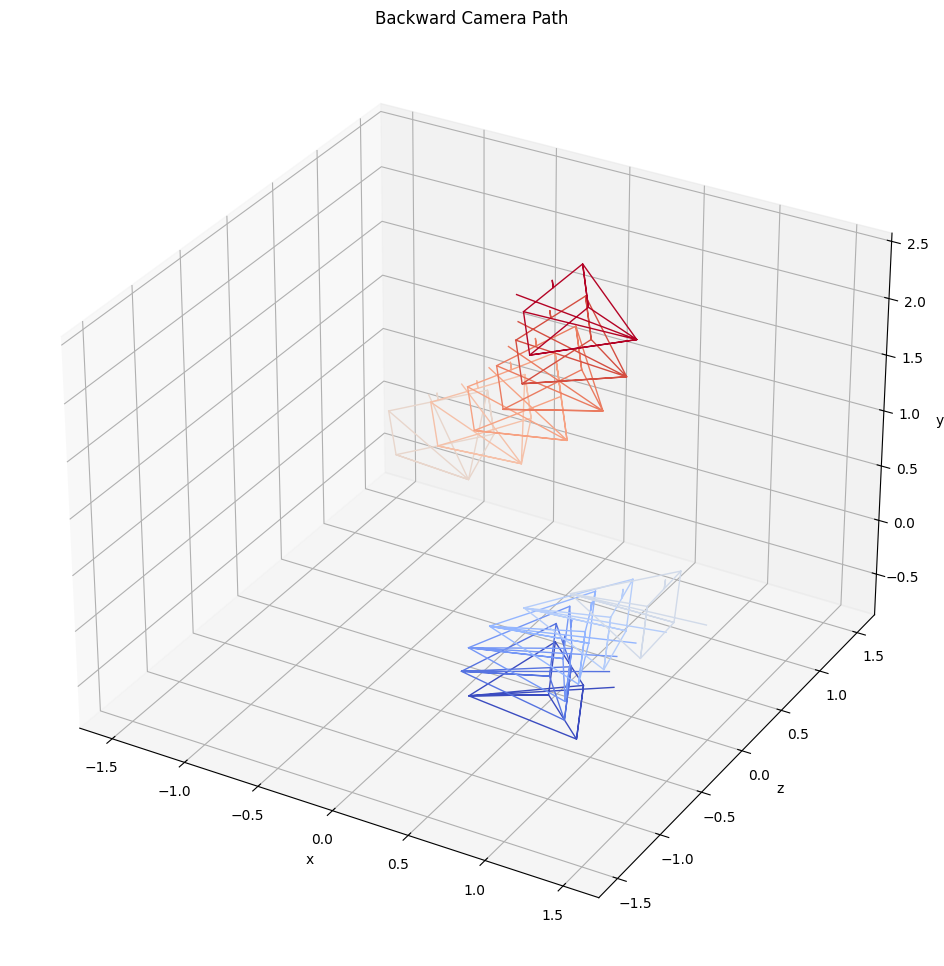

In [138]:
# Plot the camera positions
plot_camera_scene(backward_cameras, title="Backward Camera Path")

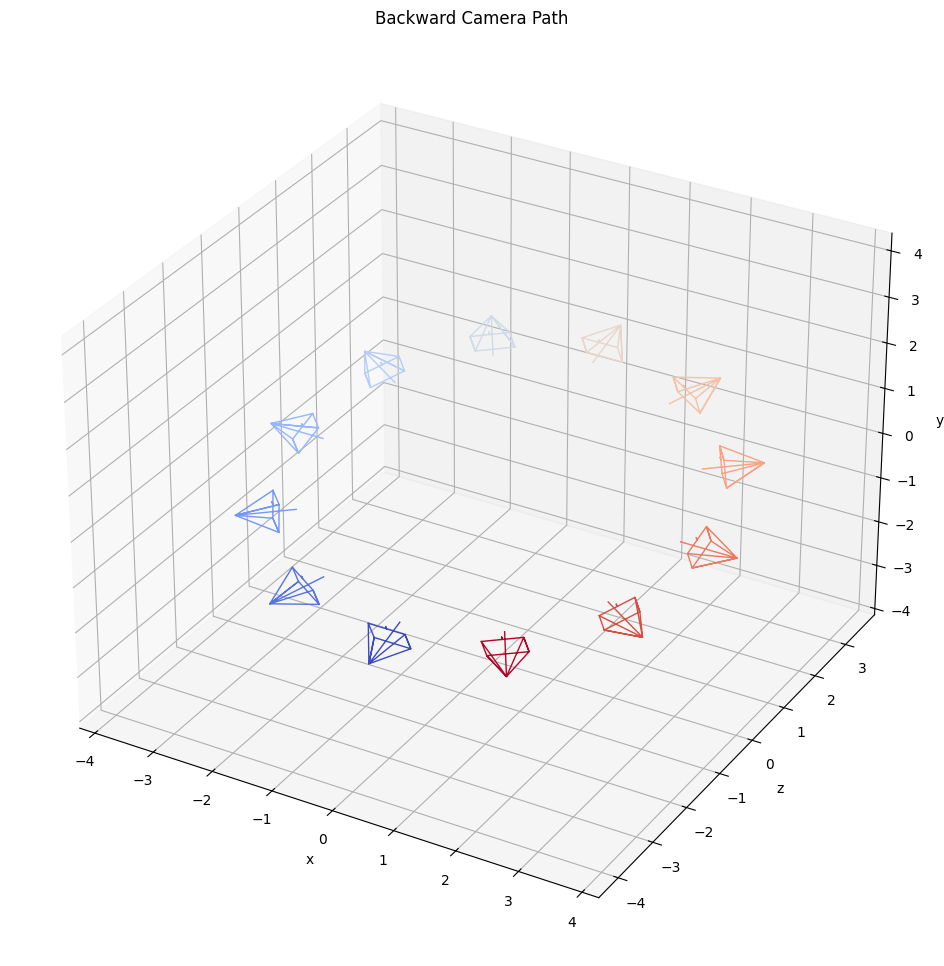

In [139]:
# Plot the camera positions
plot_camera_scene(sphere_rot_cameras, title="Backward Camera Path")

In [140]:
import os

# Create the directory to save plots if it doesn't exist
output_dir = "camera_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)


In [141]:
def generate_and_save_cameras_plot(config_fn, steps=9, output_name="plot.png"):
    cameras = []
    for i in range(steps):
        extrinsics = config_fn(i, steps)
        R = extrinsics[:3, :3]
        T = extrinsics[:3, 3]
        cameras.append(FoVPerspectiveCameras(R=R[None], T=T[None]))

    plot_camera_scene(
        cameras_list=cameras,
        annotate=True,
        title=output_name.split(".")[0],
        save_path=os.path.join(output_dir, output_name)
    )


Plot saved to camera_plots/forward.png


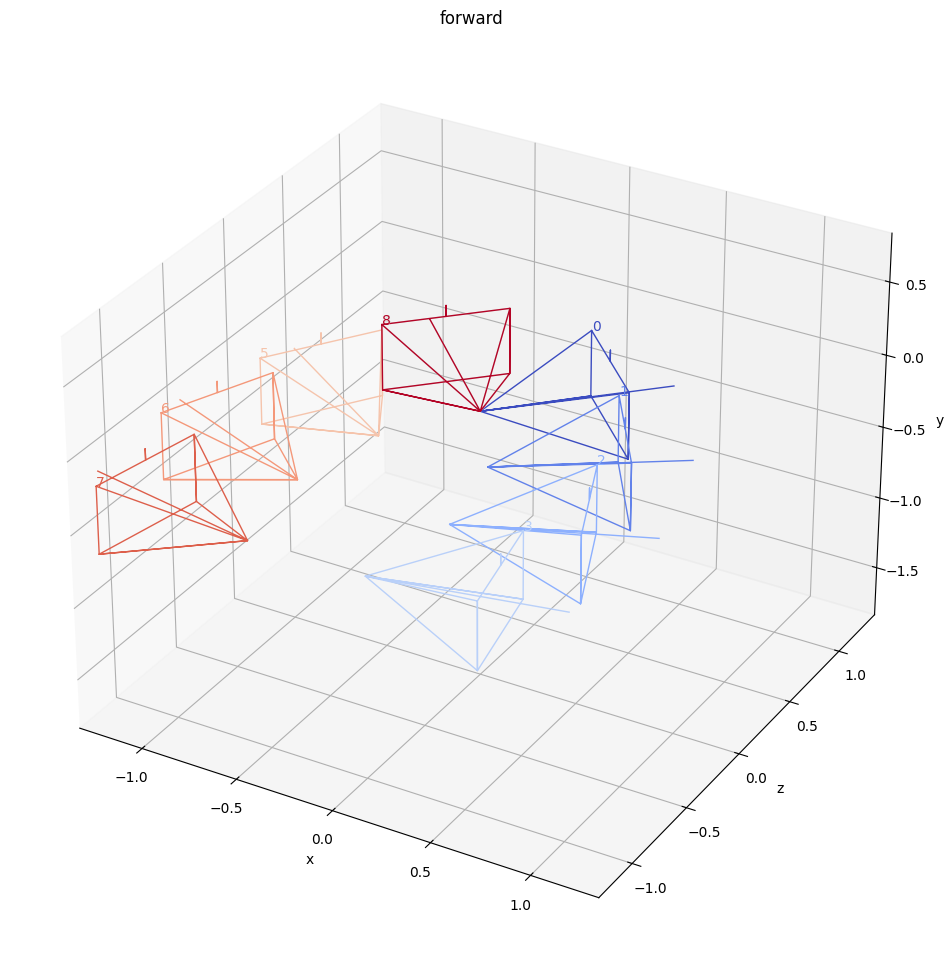

Plot saved to camera_plots/forward_small.png


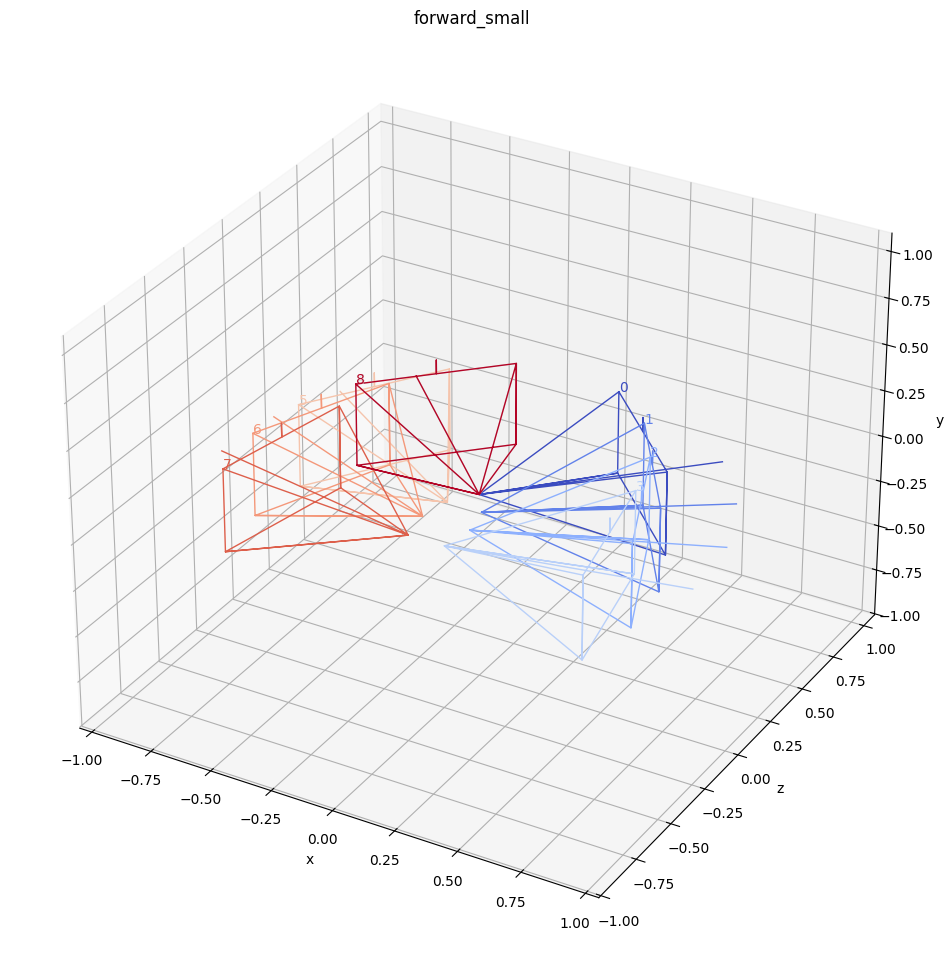

Plot saved to camera_plots/left_right.png


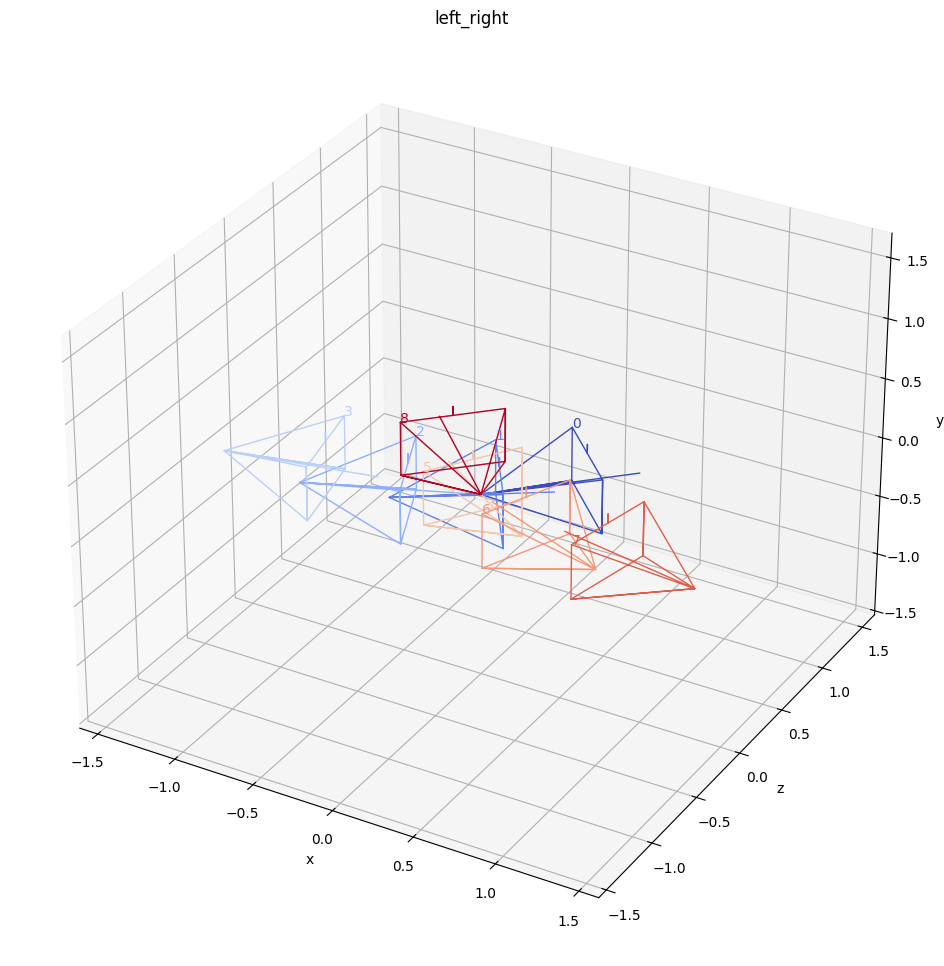

Plot saved to camera_plots/backward.png


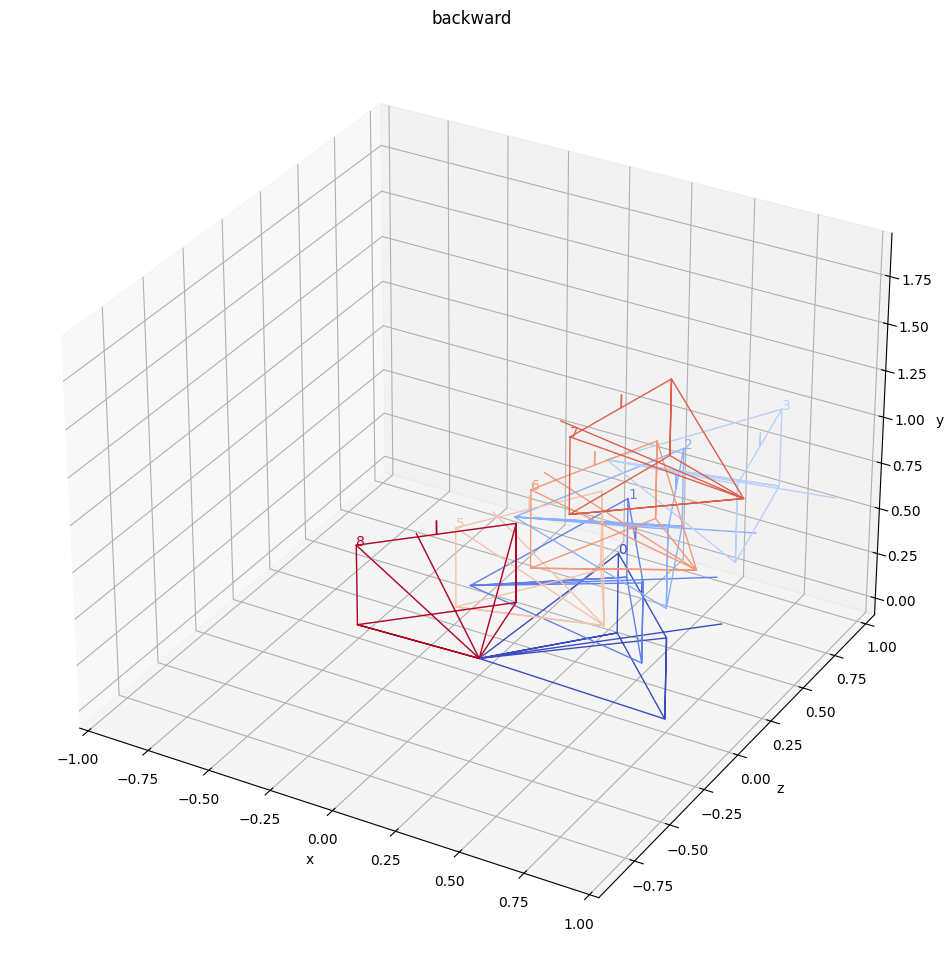

Plot saved to camera_plots/backward2.png


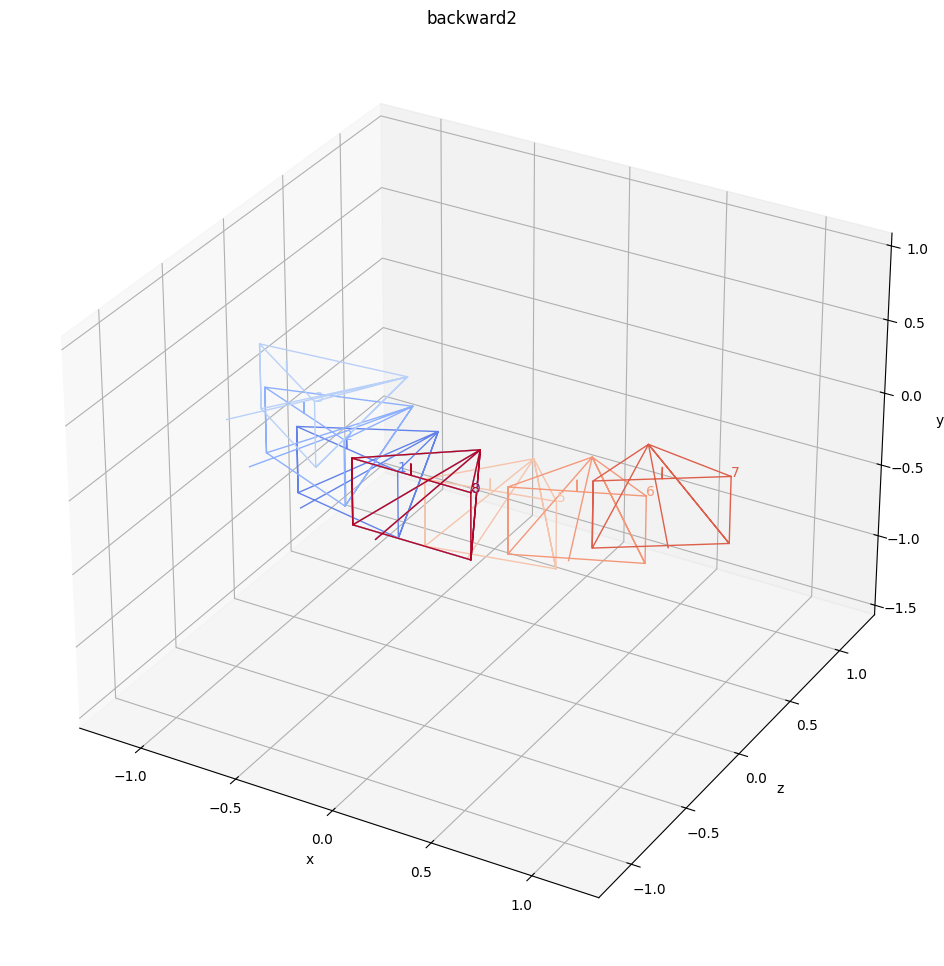

Plot saved to camera_plots/backward2_small.png


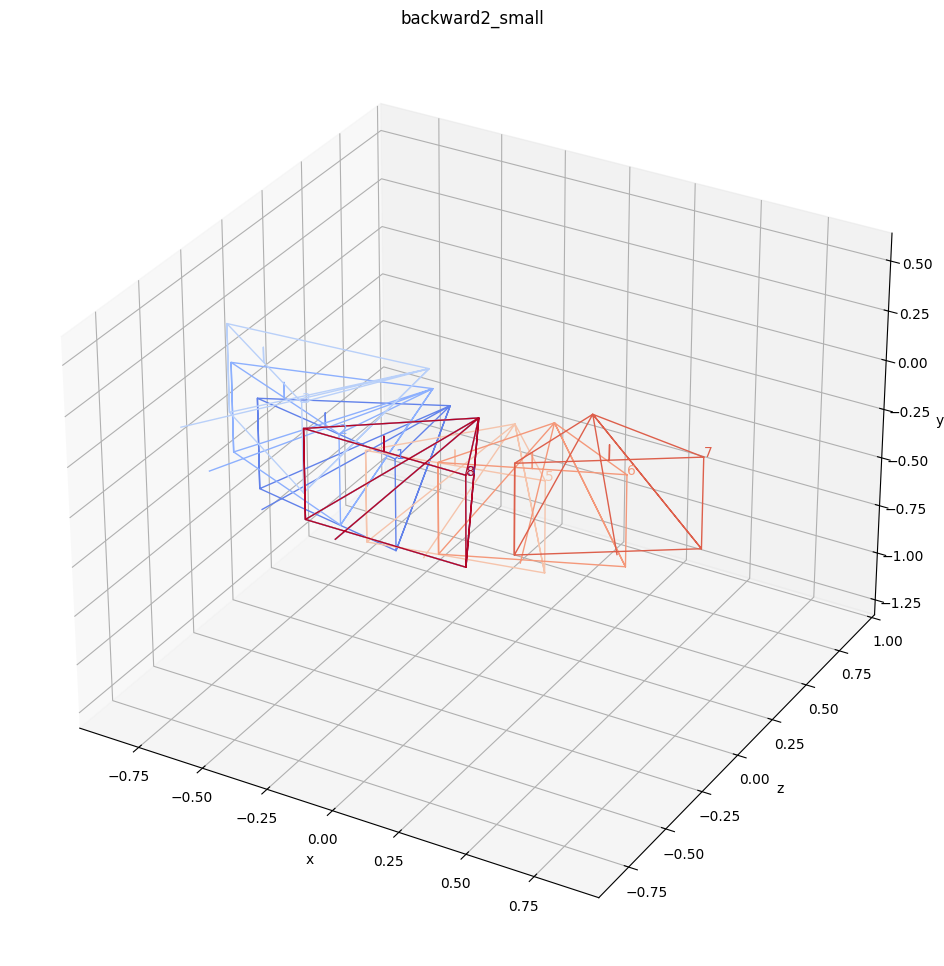

Plot saved to camera_plots/backward3.png


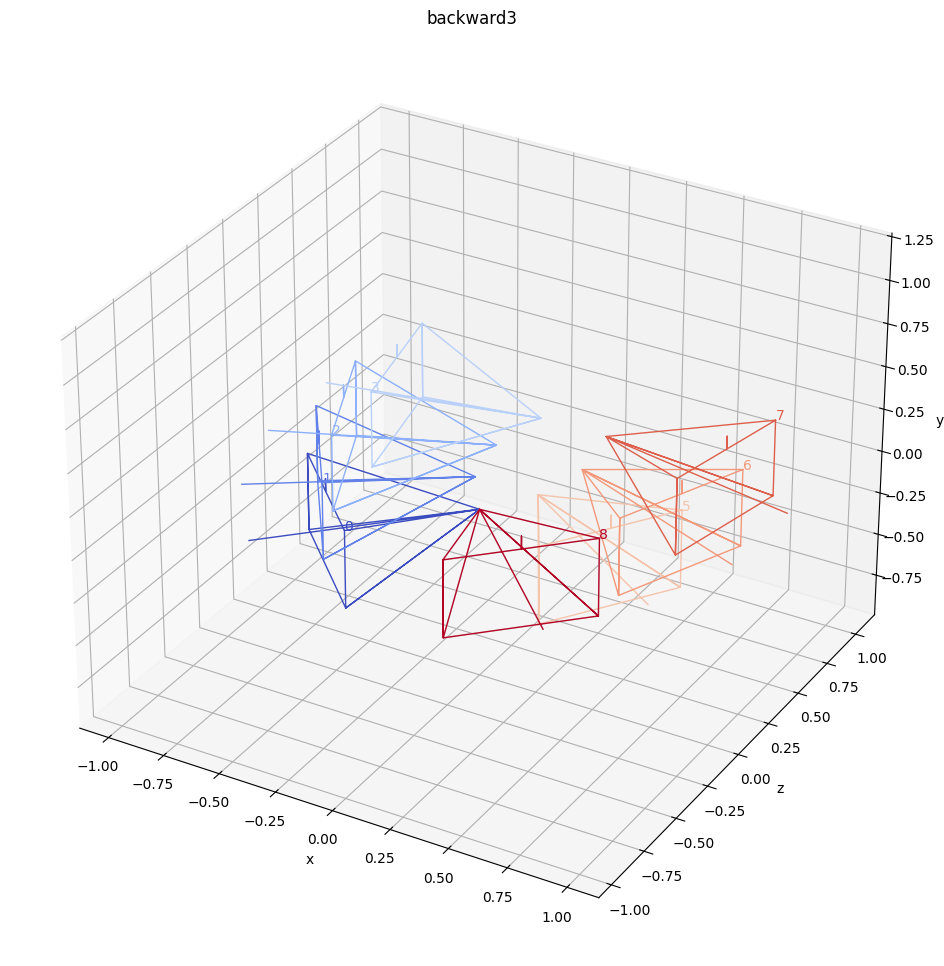

Plot saved to camera_plots/backward3_small.png


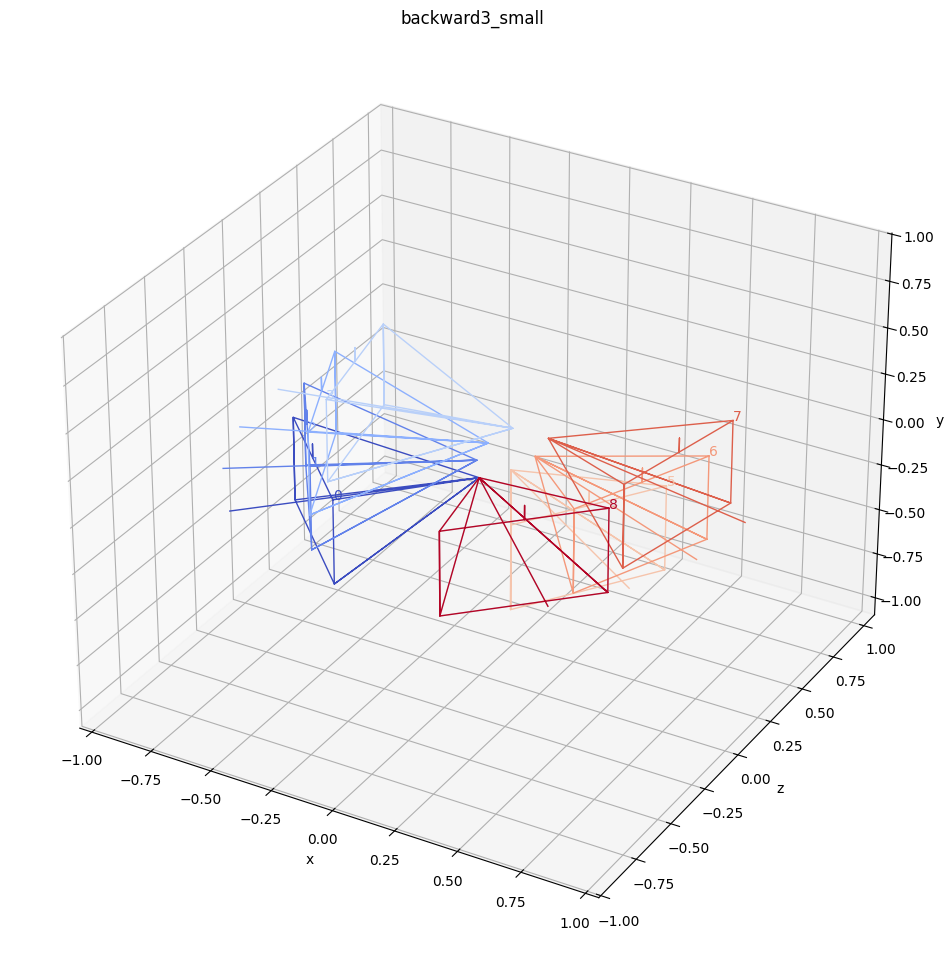

Plot saved to camera_plots/rot_left_up_down.png


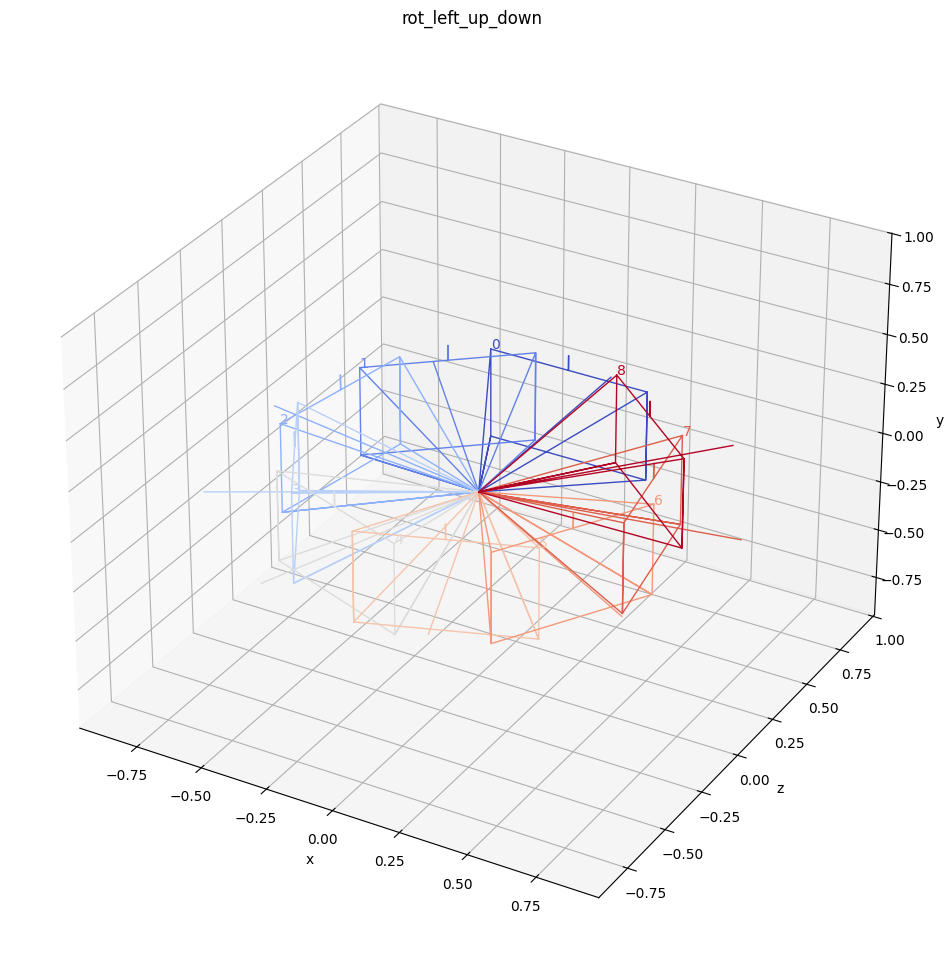

Plot saved to camera_plots/back_and_forth_forward.png


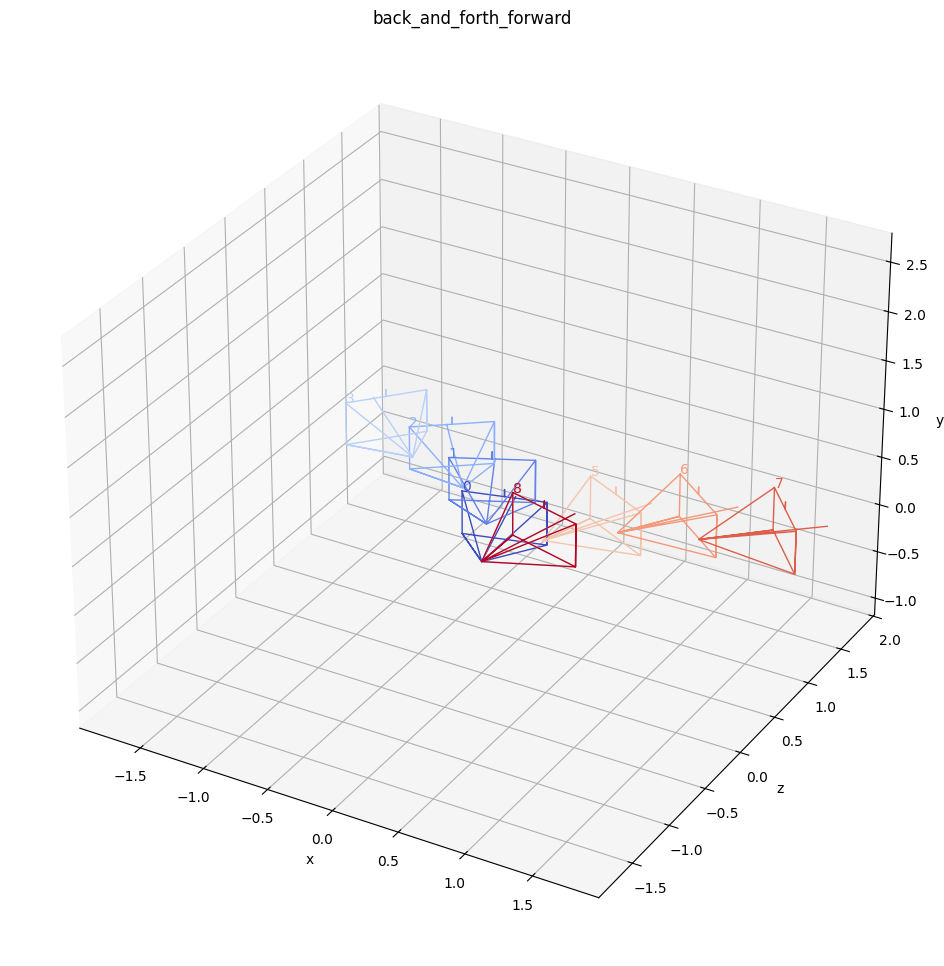

Plot saved to camera_plots/back_and_forth_backward.png


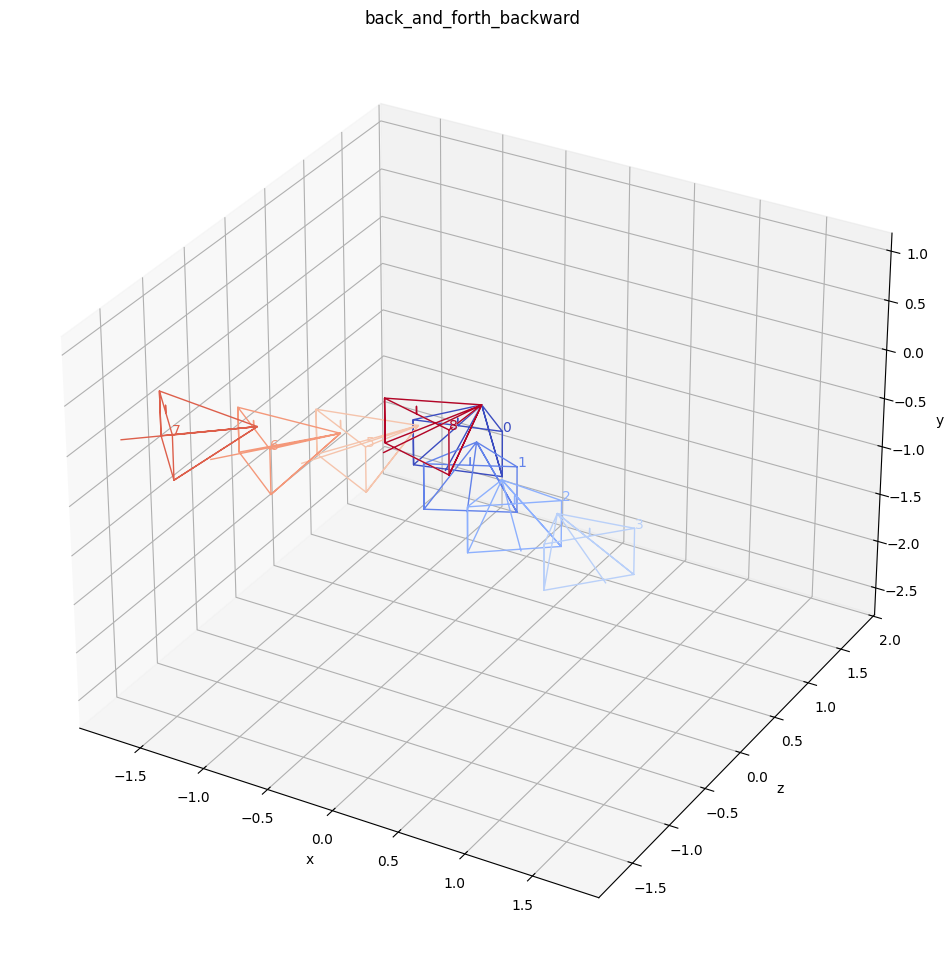

Plot saved to camera_plots/back_and_forth_forward_reverse.png


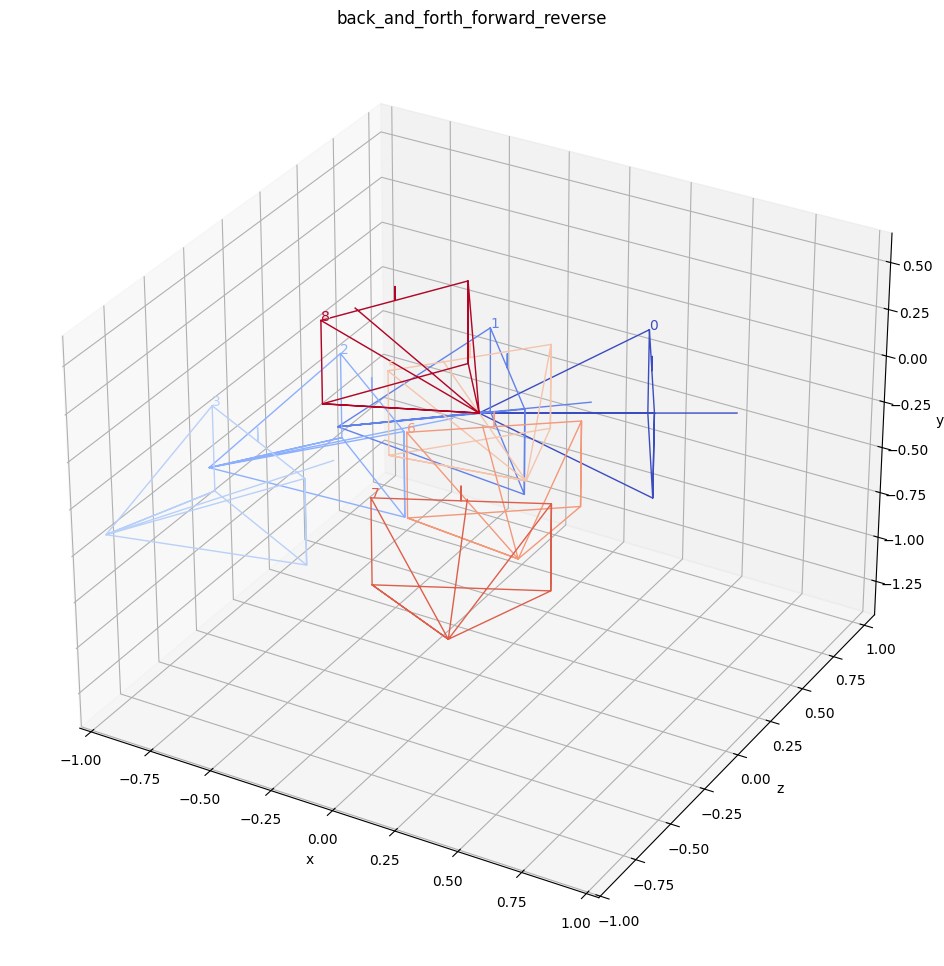

Plot saved to camera_plots/back_and_forth_forward_reverse_small.png


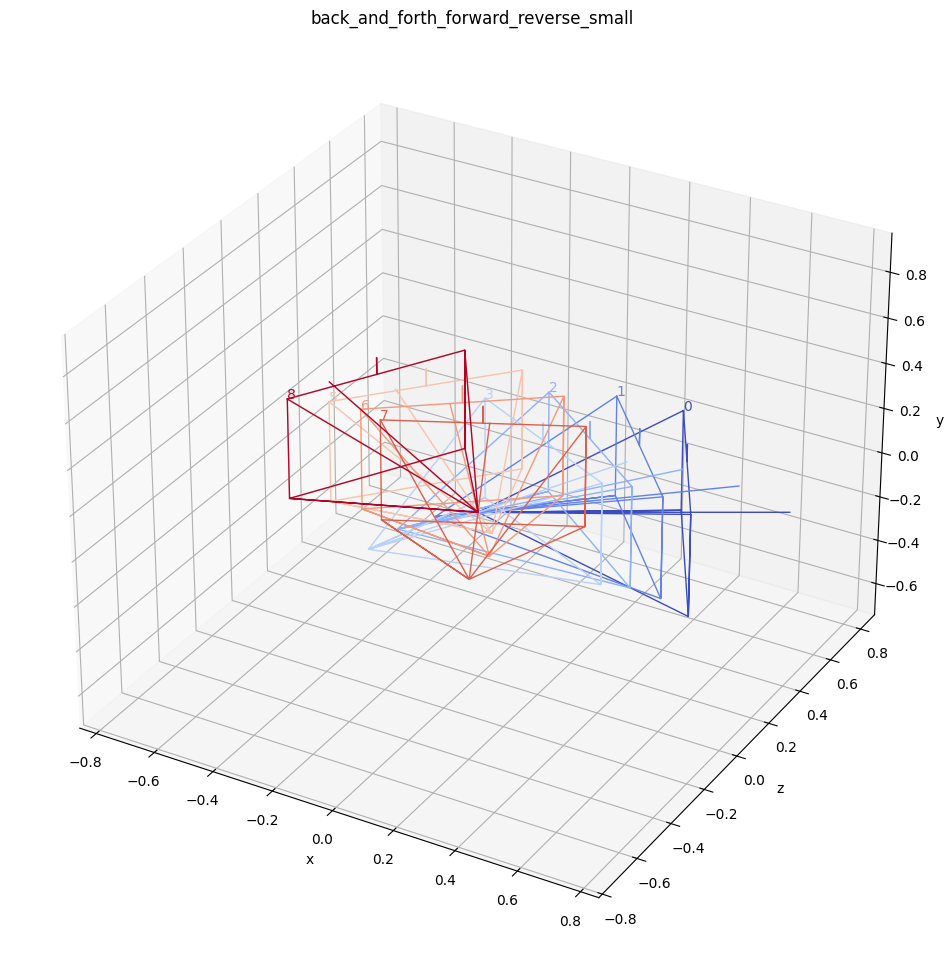

Plot saved to camera_plots/back_and_forth_backward_reverse.png


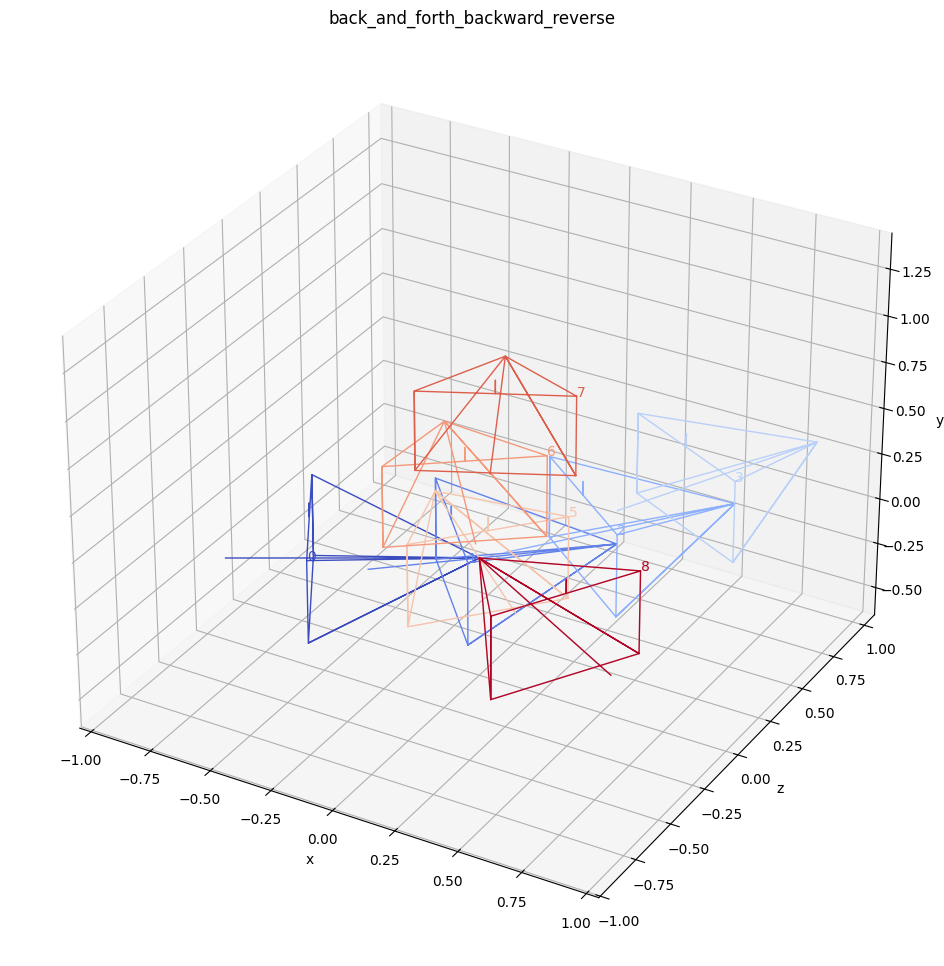

Plot saved to camera_plots/back_and_forth_backward_reverse_small.png


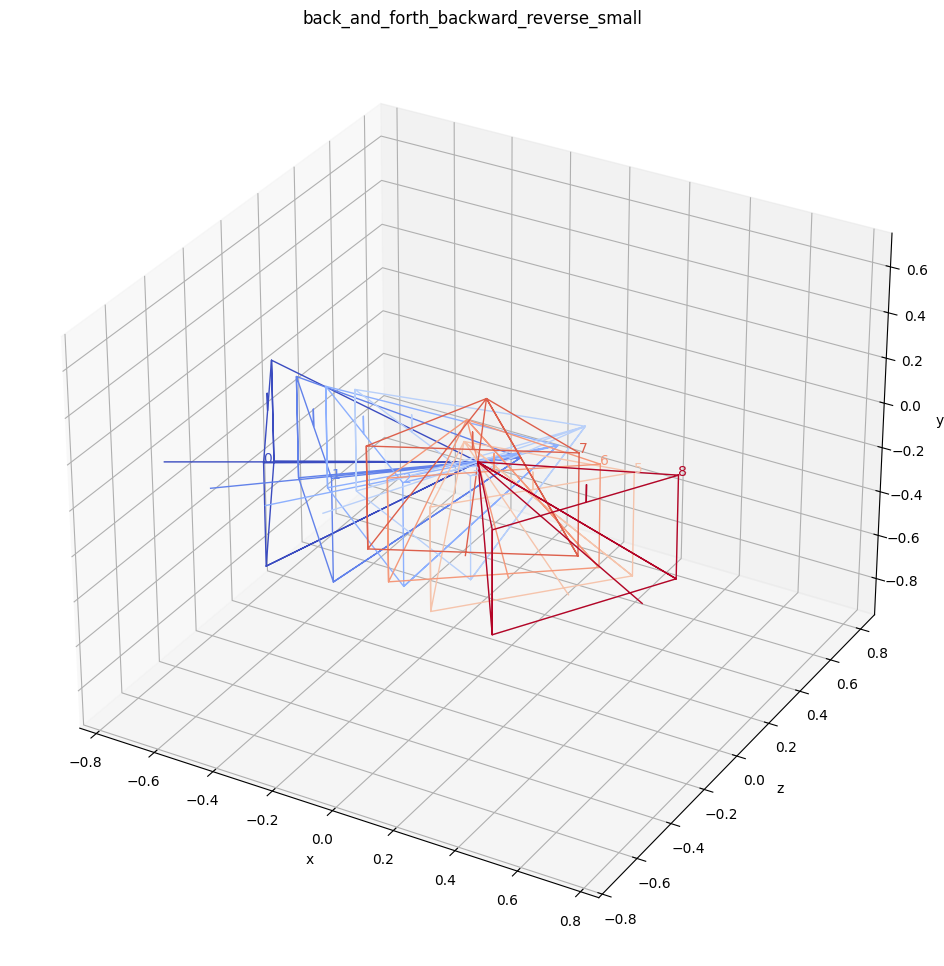

Plot saved to camera_plots/back_and_forth_backward_reverse2.png


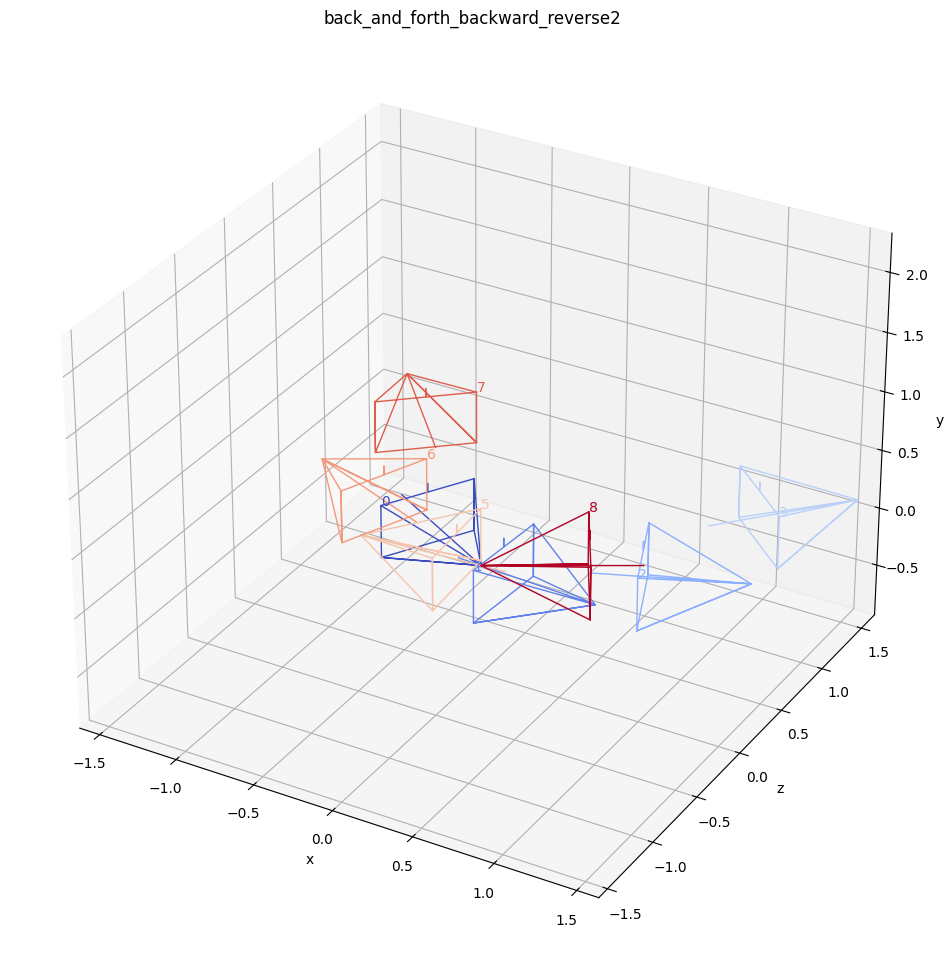

Plot saved to camera_plots/sphere_rot.png


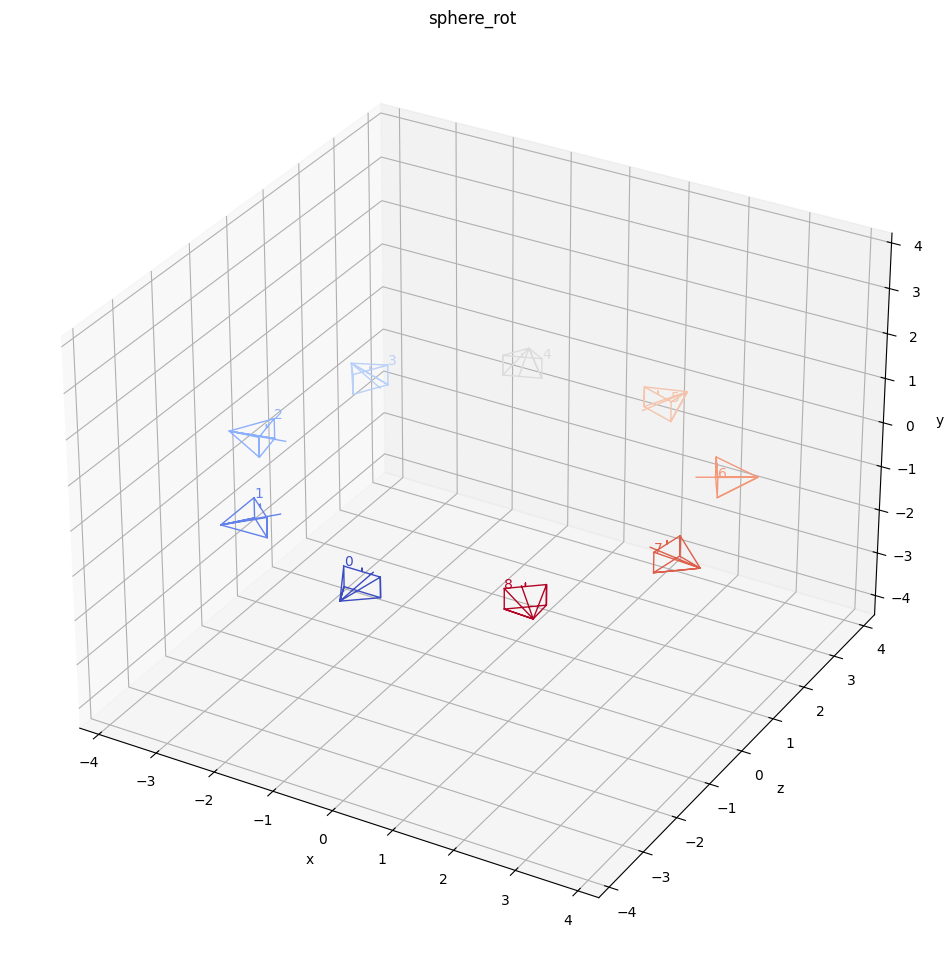

Plot saved to camera_plots/double_rot.png


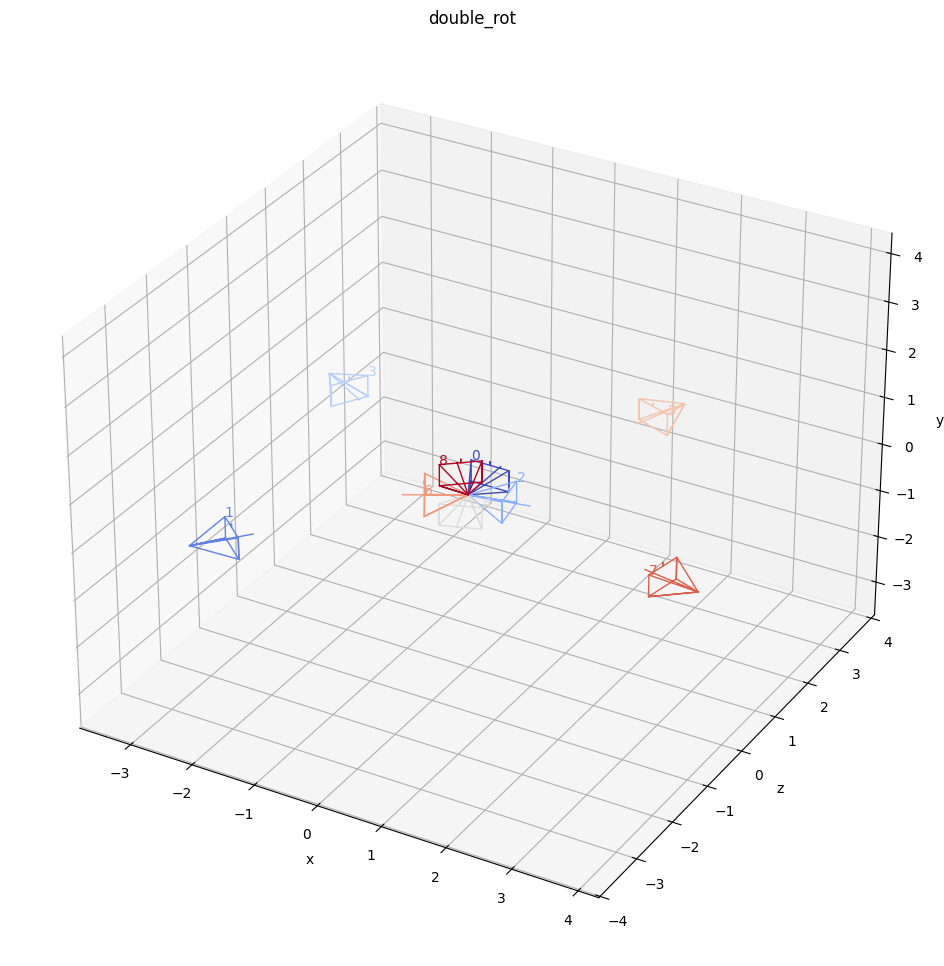

In [142]:
# Define camera configuration functions
camera_functions = {
    "forward": forward(height=0, rot=0, txmax=2),
    "forward_small": forward_small(height=0, rot=0),
    "left_right": left_right(height=0, rot=0),
    "backward": backward(height=0, rot=0),
    "backward2": backward2(height=0, rot=0, txmax=1),
    "backward2_small": backward2_small(height=0, rot=0),
    "backward3": backward3(height=0, rot=0, txmax=1),
    "backward3_small": backward3_small(height=0, rot=0),
    "rot_left_up_down": rot_left_up_down(height=0, rot=0),
    "back_and_forth_forward": back_and_forth_forward(height=0, rot=0),
    "back_and_forth_backward": back_and_forth_backward(height=0, rot=0),
    "back_and_forth_forward_reverse": back_and_forth_forward_reverse(height=0, rot=0, tzmax=2),
    "back_and_forth_forward_reverse_small": back_and_forth_forward_reverse_small(height=0, rot=0),
    "back_and_forth_backward_reverse": back_and_forth_backward_reverse(height=0, rot=0, tzmax=2),
    "back_and_forth_backward_reverse_small": back_and_forth_backward_reverse_small(height=0, rot=0),
    "back_and_forth_backward_reverse2": back_and_forth_backward_reverse2(height=0, rot=0),
    "sphere_rot": sphere_rot(radius=4.0, height=0.0, phi=20.0),
    "double_rot": double_rot(radius=4.0, height=0.0, phi=2.0)
}

# Generate and save plots
for name, config_fn in camera_functions.items():
    generate_and_save_cameras_plot(config_fn, steps=9, output_name=f"{name}.png")


In [143]:
from PIL import Image
import os

def create_image_grid(image_folder, output_image, grid_size=(4, 5)):
    """
    Create a grid image from all images in the specified folder.

    Args:
        image_folder (str): Path to the folder containing images.
        output_image (str): Path to save the resulting grid image.
        grid_size (tuple): Number of rows and columns in the grid (rows, cols).
    """
    image_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]
    image_files.sort()  # Sort to maintain a consistent order
    
    images = [Image.open(os.path.join(image_folder, img)) for img in image_files]
    
    # Determine the size of the grid
    num_images = len(images)
    grid_width, grid_height = grid_size
    
    # Assume all images have the same size
    img_width, img_height = images[0].size
    
    # Create the output image canvas
    grid_img_width = img_width * grid_width
    grid_img_height = img_height * grid_height
    grid_img = Image.new('RGB', (grid_img_width, grid_img_height), (255, 255, 255))
    
    # Paste each image into the grid
    for idx, img in enumerate(images):
        row = idx // grid_width
        col = idx % grid_width
        x = col * img_width
        y = row * img_height
        grid_img.paste(img, (x, y))
    
    # Save the grid image
    grid_img.save(output_image)
    print(f"Grid image saved to {output_image}")


In [144]:
# Create the grid image from the saved plots
create_image_grid(image_folder="camera_plots", output_image="camera_plots_grid.png", grid_size=(4, 5))


Grid image saved to camera_plots_grid.png


[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
Plot saved to robot_camera_trajectory.png


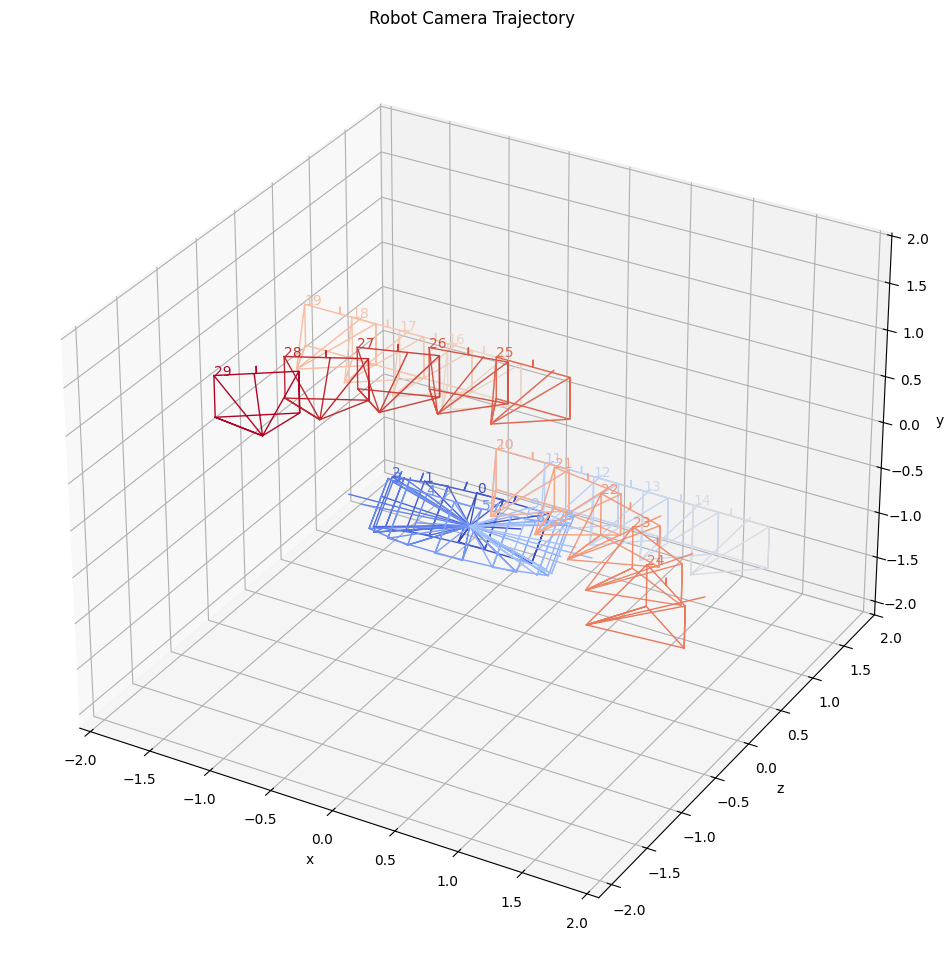

In [192]:
def trans_t(t):
    return torch.Tensor([
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1]]).float()

def rot_phi(phi):
    phi = np.deg2rad(phi)
    return torch.Tensor([
        [1, 0, 0, 0],
        [0, np.cos(phi), -np.sin(phi), 0],
        [0, np.sin(phi), np.cos(phi), 0],
        [0, 0, 0, 1]]).float()

def rot_theta(theta):
    theta = np.deg2rad(theta)
    return torch.Tensor([
        [np.cos(theta), 0, -np.sin(theta), 0],
        [0, 1, 0, 0],
        [np.sin(theta), 0, np.cos(theta), 0],
        [0, 0, 0, 1]]).float()

def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi) @ c2w
    c2w = rot_theta(theta) @ c2w
    c2w[0:3, 3] = -1 * c2w[0:3, 3]
    return c2w

def move_forward(dist, height=0.0):
    """
    Moves the camera forward by a given distance.
    """
    return _config_fn(_back_and_forth, txmax=dist, tzmax=0, tymin=height, tymax=height)

def rotate_in_place(angle, height=0.0):
    """
    Rotates the camera in place by a given angle.
    """
    return _config_fn(_rot_left, ty=height, rx=angle)

def curve_move(dist, angle, height=0.0):
    """
    Moves the camera forward while turning by a given angle.
    """
    return _config_fn(_circle, txmax=dist, rymax=angle, rymin=0, tymin=height, tymax=height)

def generate_robot_camera_trajectory(steps=10, height=0.0):
    trajectory = []

    # Start by rotating the camera
    for i in range(steps):
        extrinsics = rotate_in_place(360/steps, height)(i, steps)
        R = extrinsics[:3, :3]
        T = extrinsics[:3, 3]
        trajectory.append(PerspectiveCameras(R=R[None], T=T[None]))

    # Move forward
    for i in range(steps):
        extrinsics = move_forward(2, height)(i, steps)
        R = extrinsics[:3, :3]
        T = extrinsics[:3, 3]
        trajectory.append(PerspectiveCameras(R=R[None], T=T[None]))

    # Curve to the left while moving forward
    for i in range(steps):
        extrinsics = curve_move(2, 45, height)(i, steps)
        R = extrinsics[:3, :3]
        T = extrinsics[:3, 3]
        trajectory.append(PerspectiveCameras(R=R[None], T=T[None]))

    # Add more movements to simulate a complete path
    # E.g., move backward, rotate, etc.

    return trajectory

# Generate the trajectory
cameras = generate_robot_camera_trajectory(steps=10, height=0.5)

# Plot the cameras to visualize the trajectory
plot_camera_scene(
    cameras_list=cameras,
    annotate=True,
    title="Robot Camera Trajectory",
    trace_path=True,  # Enable tracing the path with lines
    save_path="robot_camera_trajectory.png"
)

tensor([[[ 1.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.6428,  0.7660,  0.0000],
         [ 0.0000, -0.7660,  0.6428,  0.0000],
         [ 0.0000, -3.9392, -0.6946,  1.0000]]])
tensor([[[ 8.0902e-01, -1.8995e-08,  5.8779e-01,  0.0000e+00],
         [-4.5027e-01,  6.4279e-01,  6.1974e-01,  0.0000e+00],
         [-3.7782e-01, -7.6604e-01,  5.2003e-01,  0.0000e+00],
         [-6.2886e-01, -3.5631e+00, -1.7056e+00,  1.0000e+00]]])
tensor([[[ 3.0902e-01, -1.1389e-08,  9.5106e-01,  0.0000e+00],
         [-7.2855e-01,  6.4279e-01,  2.3672e-01,  0.0000e+00],
         [-6.1133e-01, -7.6604e-01,  1.9863e-01,  0.0000e+00],
         [ 9.9105e-01, -2.5783e+00, -2.8932e+00,  1.0000e+00]]])
tensor([[[-3.0902e-01,  1.1389e-08,  9.5106e-01,  0.0000e+00],
         [-7.2855e-01,  6.4279e-01, -2.3672e-01,  0.0000e+00],
         [-6.1133e-01, -7.6604e-01, -1.9863e-01,  0.0000e+00],
         [ 3.4738e+00, -1.3610e+00, -1.4425e+00,  1.0000e+00]]])
tensor([[[-8.0902e-01,  1.8995e-08,  5.8779e-01,

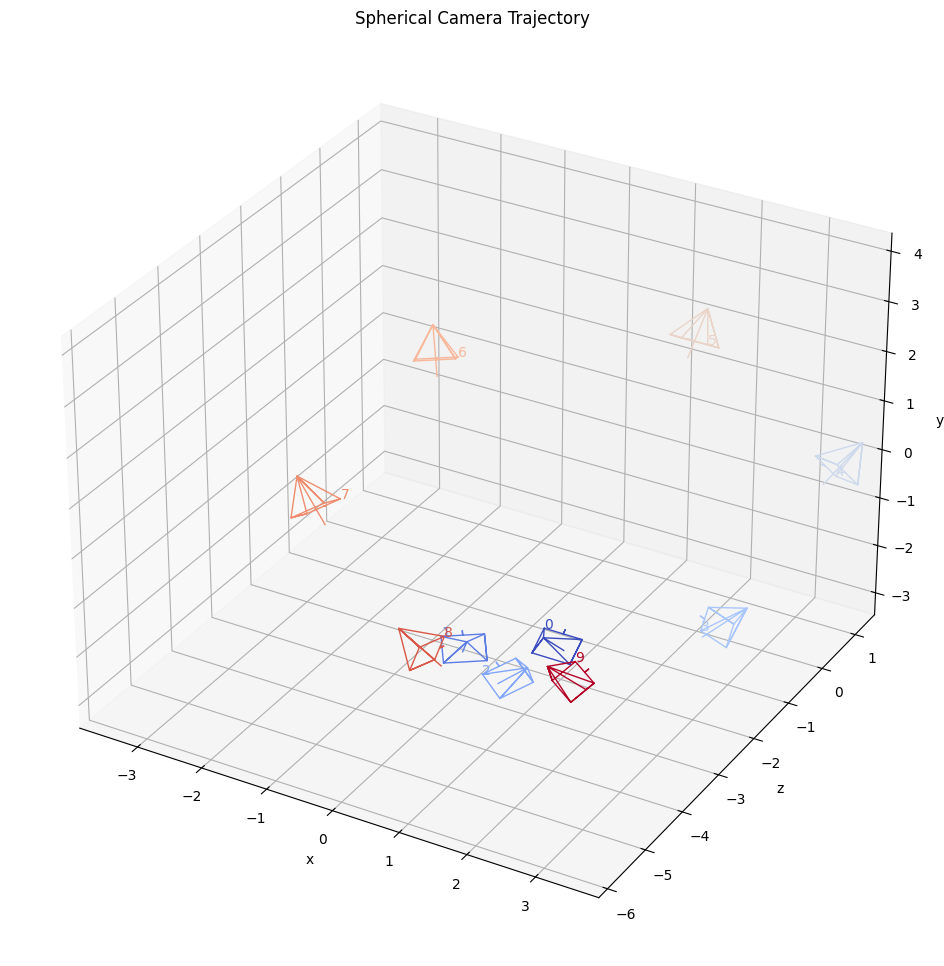

In [205]:
# Define the spherical camera trajectory using the pose_spherical function
def generate_spherical_camera_trajectory(num_cameras=10, radius=4.0, phi=30.0):
    cameras = []
    for i in range(num_cameras):
        theta = i * 360 / num_cameras  # Distribute cameras evenly around the circle
        c2w = pose_spherical(theta, phi, radius)
        
        # Extract the rotation (R) and translation (T) components
        R = c2w[:3, :3]  # Rotation matrix
        T = c2w[:3, 3]  # Translation vector
        
        # Create a FoVPerspectiveCameras object for each camera
        camera = FoVPerspectiveCameras(R=R[None], T=T[None], device="cpu")
        cameras.append(camera)
    
    return cameras

# Generate a camera trajectory using the pose_spherical function
cameras = generate_spherical_camera_trajectory(num_cameras=10, radius=4.0, phi=50.0)

# Plot the cameras to visualize the trajectory
plot_camera_scene(
    cameras_list=cameras,
    annotate=True,
    title="Spherical Camera Trajectory",
    trace_path=True,  # Enable tracing the path with lines
    save_path="spherical_camera_trajectory.png"
)

tensor([[[ 1.,  0.,  0.,  0.],
         [ 0.,  1.,  0.,  0.],
         [ 0.,  0.,  1.,  0.],
         [ 0.,  0., -4.,  1.]]])
tensor([[[ 0.8090,  0.0000, -0.5878,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.5878,  0.0000,  0.8090,  0.0000],
         [-2.3511,  0.0000, -3.2361,  1.0000]]])
tensor([[[ 0.3090,  0.0000, -0.9511,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.9511,  0.0000,  0.3090,  0.0000],
         [-3.8042,  0.0000, -1.2361,  1.0000]]])
tensor([[[-0.3090,  0.0000, -0.9511,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.9511,  0.0000, -0.3090,  0.0000],
         [-3.8042,  0.0000,  1.2361,  1.0000]]])
tensor([[[-0.8090,  0.0000, -0.5878,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.5878,  0.0000, -0.8090,  0.0000],
         [-2.3511,  0.0000,  3.2361,  1.0000]]])
tensor([[[-1.0000e+00,  0.0000e+00, -1.2246e-16,  0.0000e+00],
         [ 0.0000e+00,  1.0000e+00,  0.0000e+00,  0

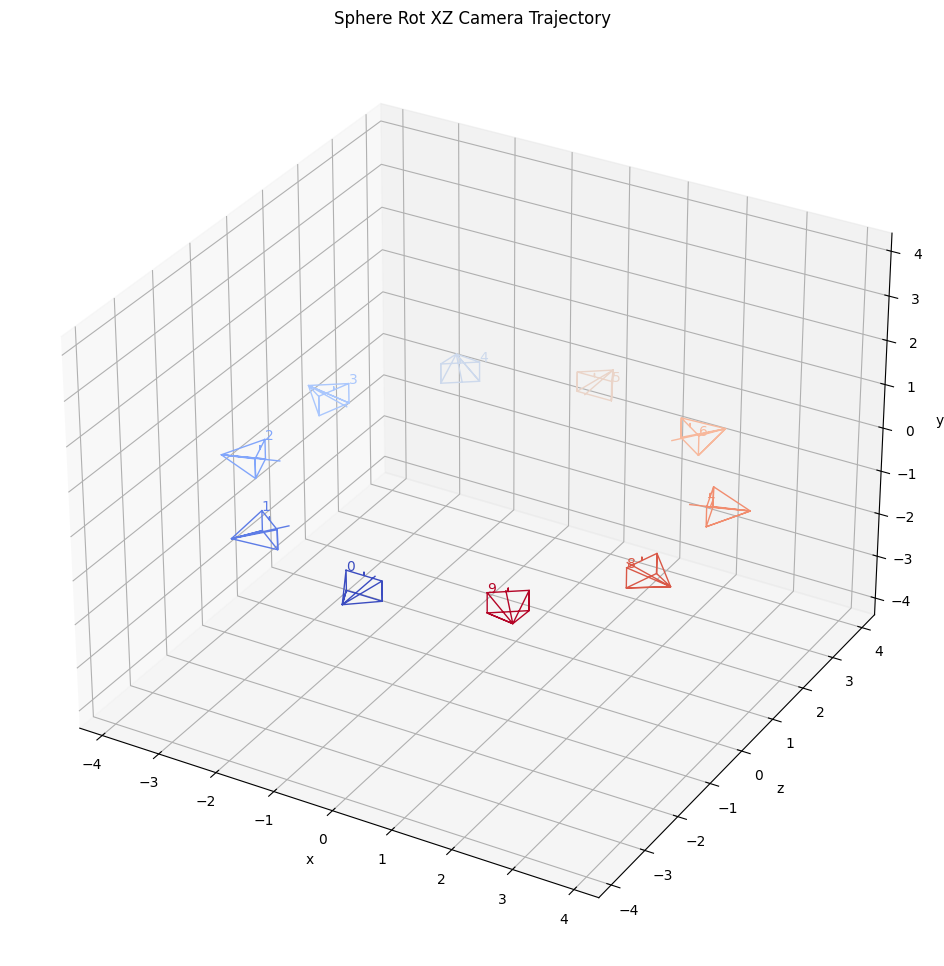

In [206]:
# Function to generate camera trajectory using _sphere_rot_xz
def generate_sphere_rot_xz_trajectory(steps=10, radius=4.0, height=0.0, phi=20.0):
    cameras = []
    for i in range(steps):
        # Generate the camera-to-world transformation matrix
        c2w_inv = _sphere_rot_xz(i, steps, radius=radius, height=height, phi=phi)
        
        # Extract the rotation (R) and translation (T) components
        R = c2w_inv[:3, :3]  # Rotation matrix
        T = c2w_inv[:3, 3]  # Translation vector
        
        # Create a FoVPerspectiveCameras object for each camera
        camera = FoVPerspectiveCameras(R=R[None], T=T[None], device="cpu")
        cameras.append(camera)
    
    return cameras

# Generate the camera trajectory
cameras = generate_sphere_rot_xz_trajectory(steps=10, radius=4.0, height=0.0, phi=50.0)

# Plot the cameras to visualize the trajectory
plot_camera_scene(
    cameras_list=cameras,
    annotate=True,
    title="Sphere Rot XZ Camera Trajectory",
    trace_path=True,  # Enable tracing the path with lines
    save_path="sphere_rot_xz_camera_trajectory.png"
)

tensor([[[ 1.,  0.,  0.,  0.],
         [ 0.,  1.,  0.,  0.],
         [ 0.,  0.,  1.,  0.],
         [ 0.,  0., -4.,  1.]]])
tensor([[[ 0.8090,  0.0000, -0.5878,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.5878,  0.0000,  0.8090,  0.0000],
         [-2.3511,  0.0000, -3.2361,  1.0000]]])
tensor([[[ 0.3090,  0.0000, -0.9511,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.9511,  0.0000,  0.3090,  0.0000],
         [-3.8042,  0.0000, -1.2361,  1.0000]]])
tensor([[[-0.3090,  0.0000, -0.9511,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.9511,  0.0000, -0.3090,  0.0000],
         [-3.8042,  0.0000,  1.2361,  1.0000]]])
tensor([[[-0.8090,  0.0000, -0.5878,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.5878,  0.0000, -0.8090,  0.0000],
         [-2.3511,  0.0000,  3.2361,  1.0000]]])
tensor([[[-1.0000e+00,  0.0000e+00, -1.2246e-16,  0.0000e+00],
         [ 0.0000e+00,  1.0000e+00,  0.0000e+00,  0

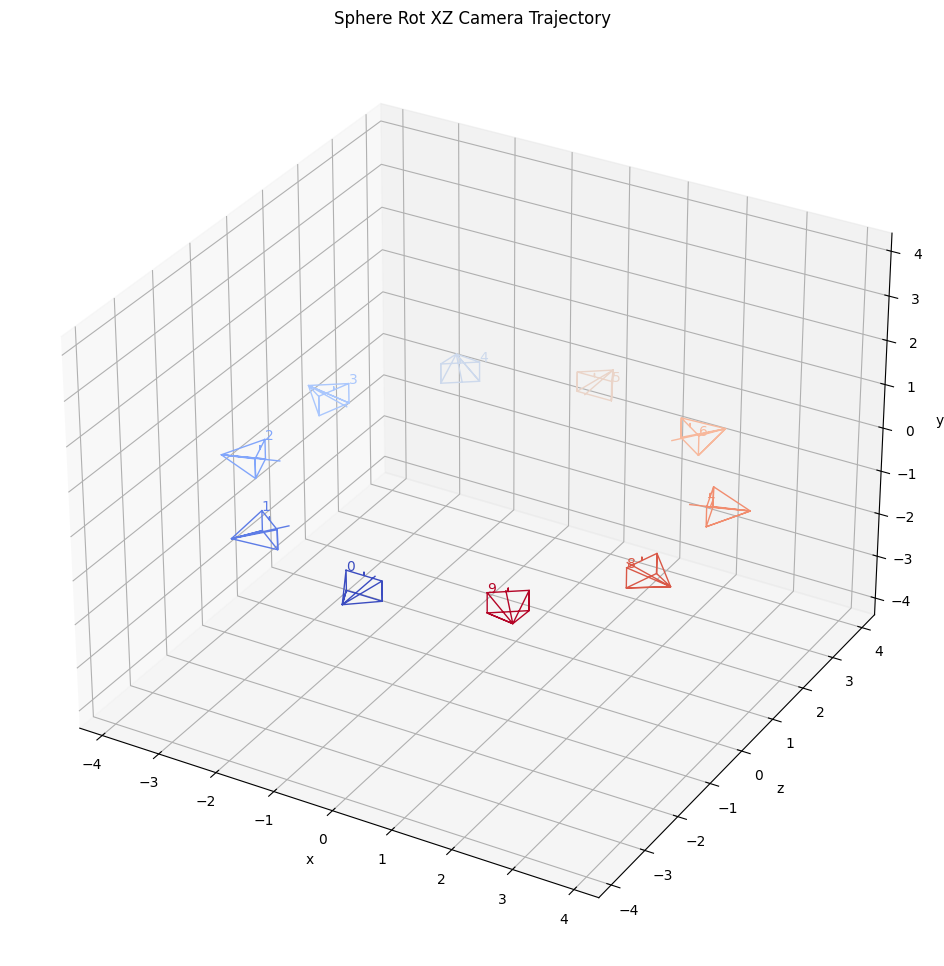

In [207]:
# Generate the camera trajectory
cameras = generate_sphere_rot_xz_trajectory(steps=10, radius=4.0, height=0.0, phi=0.0)

# Plot the cameras to visualize the trajectory
plot_camera_scene(
    cameras_list=cameras,
    annotate=True,
    title="Sphere Rot XZ Camera Trajectory",
    trace_path=True,  # Enable tracing the path with lines
    save_path="sphere_rot_xz_camera_trajectory.png"
)

tensor([[[ 1.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  1.0000,  0.0000],
         [ 0.0000, -0.2000,  0.0000,  1.0000]]])
tensor([[[1.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 1.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 1.0000, 0.0000],
         [0.0000, 0.2000, 0.0000, 1.0000]]])
tensor([[[1.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 1.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 1.0000, 0.0000],
         [0.2000, 0.0000, 0.0000, 1.0000]]])
tensor([[[ 1.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  1.0000,  0.0000],
         [-0.2000,  0.0000,  0.0000,  1.0000]]])
tensor([[[ 1.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  1.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  1.0000,  0.0000],
         [ 0.1414, -0.1414,  0.0000,  1.0000]]])
tensor([[[1.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 1.0000, 0.0000, 0.000

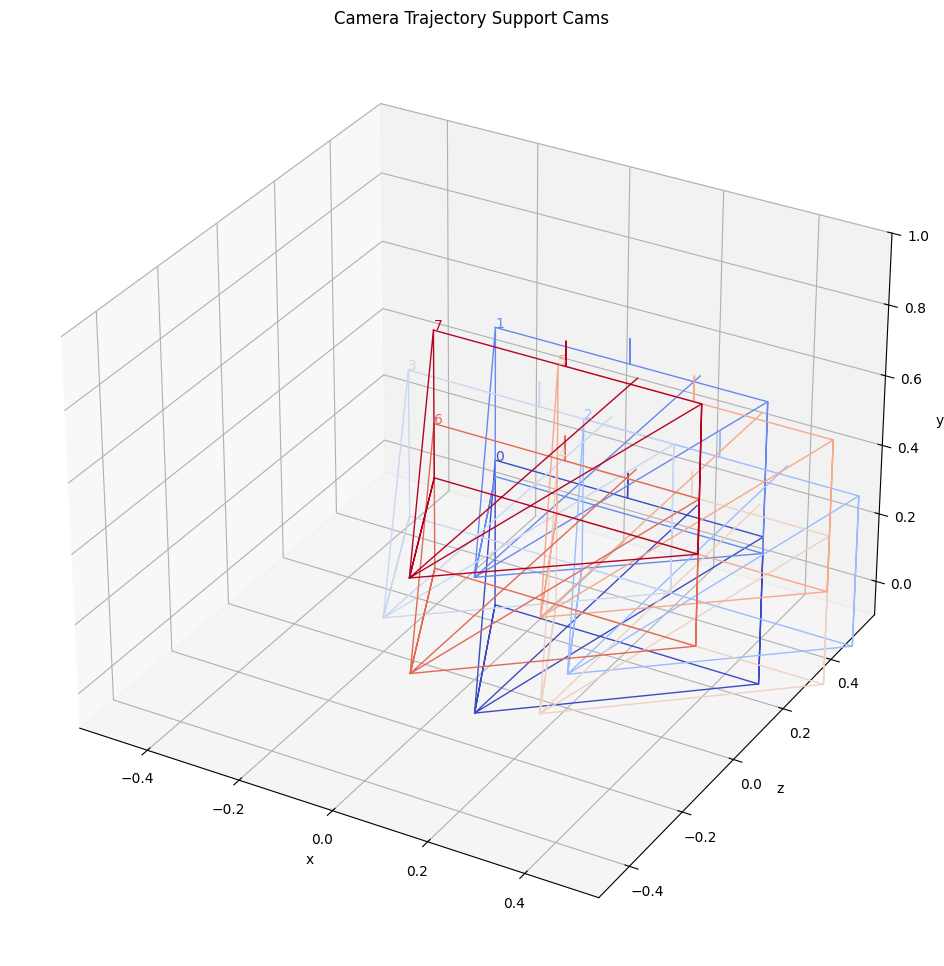

In [210]:
import numpy as np
import torch
from pytorch3d.renderer import PerspectiveCameras
import matplotlib.pyplot as plt

# Function to create the initial camera pose
def create_initial_camera_pose(x0, y0, z0):
    return torch.tensor([[1, 0, 0, x0],
                         [0, 1, 0, y0],
                         [0, 0, 1, z0],
                         [0, 0, 0, 1]], dtype=torch.float32)

# Function to generate the surrounding camera poses
def generate_camera_poses(P0, r=0.2):
    directions = [
        (0, r, 0),   # Up
        (0, -r, 0),  # Down
        (-r, 0, 0),  # Left
        (r, 0, 0),   # Right
        (-r/np.sqrt(2), r/np.sqrt(2), 0),   # Upper Left
        (-r/np.sqrt(2), -r/np.sqrt(2), 0),  # Lower Left
        (r/np.sqrt(2), r/np.sqrt(2), 0),    # Upper Right
        (r/np.sqrt(2), -r/np.sqrt(2), 0)    # Lower Right
    ]

    camera_poses = []
    for d in directions:
        Pi = P0.clone()
        Pi[:3, 3] += torch.tensor(d, dtype=torch.float32)
        camera_poses.append(Pi[:3, :].unsqueeze(0))  # Add batch dimension
    return camera_poses

# Function to create PerspectiveCameras from poses
def create_perspective_cameras(poses):
    cameras = []
    for pose in poses:
        R = pose[:, :3, :3]
        T = pose[:, :3, 3]
        cameras.append(PerspectiveCameras(R=R, T=T))
    return cameras

# Initialize the parameters
x0, y0, z0 = 0.0, 0.0, 0.0
initial_pose = create_initial_camera_pose(x0, y0, z0)

# Generate surrounding camera poses
camera_poses = generate_camera_poses(initial_pose)

# Create PerspectiveCameras from the poses
cameras = create_perspective_cameras(camera_poses)

# Plot the cameras to visualize the trajectory
plot_camera_scene(
    cameras_list=cameras,
    annotate=True,
    title="Camera Trajectory Support Cams",
    trace_path=True,  # Enable tracing the path with lines
    save_path="camera_trajectory.png"
)